Implementing main analysis from https://www.nature.com/articles/s41586-021-03569-1#data-availability

In [1]:
import scanpy as sc
from pathlib import Path
import scvi
import seaborn as sns
import pandas as pd
import numpy as np
import os
import gc
from scipy.sparse import csr_matrix
import matplotlib.pyplot as plt
import gseapy as gp


Global seed set to 0
/home/jared/mambaforge/envs/scvi-env/lib/python3.10/site-packages/pytorch_lightning/utilities/warnings.py:53: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
  new_rank_zero_deprecation(
/home/jared/mambaforge/envs/scvi-env/lib/python3.10/site-packages/pytorch_lightning/utilities/warnings.py:58: LightningDeprecationWarning: The `pytorch_lightning.loggers.base.rank_zero_experiment` is deprecated in v1.7 and will be removed in v1.9. Please use `pytorch_lightning.loggers.logger.rank_zero_experiment` instead.
  return new_rank_zero_deprecation(*args, **kwargs)


In [2]:
import diffxpy.api as de

# Initial test

In [4]:
!pwd

/home/jared/Documents/cs/comp-bio


In [15]:
cwd = Path.cwd()

In [6]:
adata = sc.read_csv('c19_data/GSM5226574_C51ctr_raw_counts.csv').T #scanpy requires cells x genes
adata

AnnData object with n_obs × n_vars = 6099 × 34546

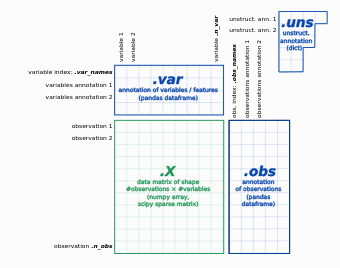

In [7]:
adata.obs #cell barcodes

""
TAGGTACCATGGCCAC-1_1
ATTCACTGTAACAGGC-1_1
TAACTTCCAACCACGC-1_1
TTGGGTACACGACAAG-1_1
AGGCCACAGAGTCACG-1_1
...
CGCCATTGTTTGCCGG-1_1
CACTGGGGTCTACGTA-1_1
CATACTTGTAGAGGAA-1_1
TTTGGTTTCCACGGAC-1_1


In [8]:
adata.var #genes

""
AL627309.1
AL627309.5
AL627309.4
AL669831.2
LINC01409
...
VN1R2
AL031676.1
SMIM34A
AL050402.1


In [9]:
adata.X #counts
print(adata.X.shape)

(6099, 34546)


## Doublet Removal
sometimes 2 cells end up in 1 droplet ----

don't do on integrated sample - do on individual samples

In [10]:
sc.pp.filter_genes(adata, min_cells=10) #keep only genes found in at least 10 cells
adata

AnnData object with n_obs × n_vars = 6099 × 19896
    var: 'n_cells'

In [11]:
sc.pp.highly_variable_genes(adata, n_top_genes=2000, subset=True, flavor='seurat_v3')
adata #now with only 2000 genes

AnnData object with n_obs × n_vars = 6099 × 2000
    var: 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'hvg'

In [12]:
scvi.model.SCVI.setup_anndata(adata)

In [13]:
vae = scvi.model.SCVI(adata)
vae.train(max_epochs=400)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 400/400: 100%|███████| 400/400 [01:24<00:00,  4.76it/s, loss=323, v_num=1]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|███████| 400/400 [01:24<00:00,  4.71it/s, loss=323, v_num=1]


In [14]:
solo = scvi.external.SOLO.from_scvi_model(vae)
solo.train()

INFO     Creating doublets, preparing SOLO model.                                                                  


/home/jared/mambaforge/envs/scvi-env/lib/python3.10/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 207/400:  52%|██▌  | 207/400 [00:59<00:55,  3.49it/s, loss=0.291, v_num=1]
Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.292. Signaling Trainer to stop.


In [15]:
df = solo.predict()
df

,doublet,singlet
TAGGTACCATGGCCAC-1_1-0,1.434787,-0.618073
ATTCACTGTAACAGGC-1_1-0,2.470863,-1.796975
TAACTTCCAACCACGC-1_1-0,0.803006,-0.261390
TTGGGTACACGACAAG-1_1-0,1.609038,-0.672560
AGGCCACAGAGTCACG-1_1-0,1.428796,-0.744231
...,...,...
CGCCATTGTTTGCCGG-1_1-0,-0.688068,1.138430
CACTGGGGTCTACGTA-1_1-0,-2.815537,2.873025
CATACTTGTAGAGGAA-1_1-0,-2.694104,2.648528
TTTGGTTTCCACGGAC-1_1-0,-3.260398,2.580597


In [16]:
df['prediction'] = solo.predict(soft = False)

In [17]:
df

,doublet,singlet,prediction
TAGGTACCATGGCCAC-1_1-0,1.434787,-0.618073,doublet
ATTCACTGTAACAGGC-1_1-0,2.470863,-1.796975,doublet
TAACTTCCAACCACGC-1_1-0,0.803006,-0.261390,doublet
TTGGGTACACGACAAG-1_1-0,1.609038,-0.672560,doublet
AGGCCACAGAGTCACG-1_1-0,1.428796,-0.744231,doublet
...,...,...,...
CGCCATTGTTTGCCGG-1_1-0,-0.688068,1.138430,singlet
CACTGGGGTCTACGTA-1_1-0,-2.815537,2.873025,singlet
CATACTTGTAGAGGAA-1_1-0,-2.694104,2.648528,singlet
TTTGGTTTCCACGGAC-1_1-0,-3.260398,2.580597,singlet


In [18]:
mask = df['prediction'] == "doublet"
filtered_df = df[mask]

print(filtered_df)

                         doublet   singlet prediction
TAGGTACCATGGCCAC-1_1-0  1.434787 -0.618073    doublet
ATTCACTGTAACAGGC-1_1-0  2.470863 -1.796975    doublet
TAACTTCCAACCACGC-1_1-0  0.803006 -0.261390    doublet
TTGGGTACACGACAAG-1_1-0  1.609038 -0.672560    doublet
AGGCCACAGAGTCACG-1_1-0  1.428796 -0.744231    doublet
...                          ...       ...        ...
ACCCTTGAGACTTCCA-1_1-0  0.390387  0.299699    doublet
CAACAACAGGTGCTTT-1_1-0  0.736548 -0.244451    doublet
CATCCCAAGACGCCAA-1_1-0  0.625263 -0.128365    doublet
CTCGAGGGTCTCCTGT-1_1-0  0.275243  0.066765    doublet
CACTGTCAGGGACAGG-1_1-0  1.264475 -0.950050    doublet

[1253 rows x 3 columns]


In [19]:
df.index = df.index.map(lambda x: x[:-2]) #remove last 2 chars from df index
df

,doublet,singlet,prediction
TAGGTACCATGGCCAC-1_1,1.434787,-0.618073,doublet
ATTCACTGTAACAGGC-1_1,2.470863,-1.796975,doublet
TAACTTCCAACCACGC-1_1,0.803006,-0.261390,doublet
TTGGGTACACGACAAG-1_1,1.609038,-0.672560,doublet
AGGCCACAGAGTCACG-1_1,1.428796,-0.744231,doublet
...,...,...,...
CGCCATTGTTTGCCGG-1_1,-0.688068,1.138430,singlet
CACTGGGGTCTACGTA-1_1,-2.815537,2.873025,singlet
CATACTTGTAGAGGAA-1_1,-2.694104,2.648528,singlet
TTTGGTTTCCACGGAC-1_1,-3.260398,2.580597,singlet


In [20]:
df.groupby('prediction').count()

,doublet,singlet
prediction,,
doublet,1253,1253
singlet,4846,4846


In [21]:
df['dif'] = df.doublet - df.singlet
df

,doublet,singlet,prediction,dif
TAGGTACCATGGCCAC-1_1,1.434787,-0.618073,doublet,2.052860
ATTCACTGTAACAGGC-1_1,2.470863,-1.796975,doublet,4.267838
TAACTTCCAACCACGC-1_1,0.803006,-0.261390,doublet,1.064396
TTGGGTACACGACAAG-1_1,1.609038,-0.672560,doublet,2.281598
AGGCCACAGAGTCACG-1_1,1.428796,-0.744231,doublet,2.173027
...,...,...,...,...
CGCCATTGTTTGCCGG-1_1,-0.688068,1.138430,singlet,-1.826498
CACTGGGGTCTACGTA-1_1,-2.815537,2.873025,singlet,-5.688562
CATACTTGTAGAGGAA-1_1,-2.694104,2.648528,singlet,-5.342632
TTTGGTTTCCACGGAC-1_1,-3.260398,2.580597,singlet,-5.840995


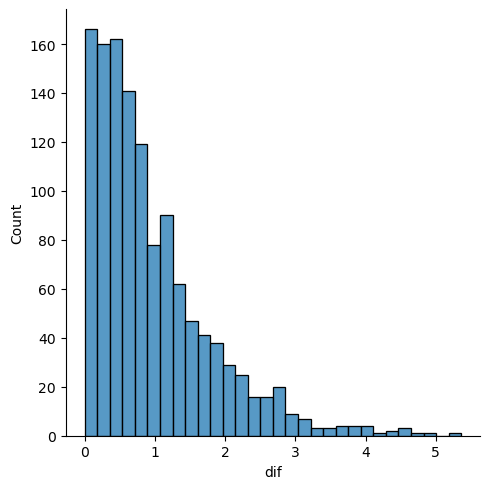

In [23]:
sns.displot(df[df.prediction == 'doublet'], x = 'dif')

can see a decent chunk of cells were predicted "doublet" but the difference in prediction for singlet is small! can filter these out

In [24]:
doublets = df[(df.prediction == 'doublet') & (df.dif > 1)]
doublets

,doublet,singlet,prediction,dif
TAGGTACCATGGCCAC-1_1,1.434787,-0.618073,doublet,2.052860
ATTCACTGTAACAGGC-1_1,2.470863,-1.796975,doublet,4.267838
TAACTTCCAACCACGC-1_1,0.803006,-0.261390,doublet,1.064396
TTGGGTACACGACAAG-1_1,1.609038,-0.672560,doublet,2.281598
AGGCCACAGAGTCACG-1_1,1.428796,-0.744231,doublet,2.173027
...,...,...,...,...
CAATACGCAATGTGGG-1_1,0.440158,-0.897775,doublet,1.337933
GGGTATTTCAGCGCAC-1_1,1.262488,-0.880912,doublet,2.143400
TTGCTGCAGTGCGACA-1_1,0.922248,-0.794706,doublet,1.716954
TACAACGGTTGACTAC-1_1,0.693379,-0.849318,doublet,1.542697


456 cells predicted as doublets with high certainty!
now can filter by the barcodes!

In [25]:
adata = sc.read_csv('c19_data/GSM5226574_C51ctr_raw_counts.csv').T #reload adata

In [26]:
adata.obs['doublet'] = adata.obs.index.isin(doublets.index) #returns true if adata obs index is in list of indices in the 'doublets' df

In [27]:
adata.obs

,doublet
TAGGTACCATGGCCAC-1_1,True
ATTCACTGTAACAGGC-1_1,True
TAACTTCCAACCACGC-1_1,True
TTGGGTACACGACAAG-1_1,True
AGGCCACAGAGTCACG-1_1,True
...,...
CGCCATTGTTTGCCGG-1_1,False
CACTGGGGTCTACGTA-1_1,False
CATACTTGTAGAGGAA-1_1,False
TTTGGTTTCCACGGAC-1_1,False


In [28]:
adata = adata[~adata.obs.doublet] # '~' lets you keep false entries

In [29]:
adata

View of AnnData object with n_obs × n_vars = 5643 × 34546
    obs: 'doublet'

## Preprocessing

In [30]:
#label mtc. genes
adata.var[adata.var.index.str.startswith('MT-')]

#in humans, mtc. genes almost always start with 'MT' - mice sometimes 'mt' or 'Mt'
len(adata.var[adata.var.index.str.startswith('MT-')])

13

/tmp/ipykernel_8261/310233584.py:1: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['mt'] = adata.var.index.str.startswith('MT-')


In [32]:
adata.var

,mt
AL627309.1,False
AL627309.5,False
AL627309.4,False
AL669831.2,False
LINC01409,False
...,...
VN1R2,False
AL031676.1,False
SMIM34A,False
AL050402.1,False


In [5]:
#label ribosomal genes (using list of known genes from Broad)

ribo_url = "http://software.broadinstitute.org/gsea/msigdb/download_geneset.jsp?geneSetName=KEGG_RIBOSOME&fileType=txt"


In [6]:
ribo_genes = pd.read_table(ribo_url, skiprows=2, header=None)
ribo_genes

,0
0,FAU
1,MRPL13
2,RPL10
3,RPL10A
4,RPL10L
...,...
83,RPS9
84,RPSA
85,RSL24D1
86,RSL24D1P11


In [36]:
ribo_genes[0].values

array(['FAU', 'MRPL13', 'RPL10', 'RPL10A', 'RPL10L', 'RPL11', 'RPL12',
       'RPL13', 'RPL13A', 'RPL14', 'RPL15', 'RPL17', 'RPL18', 'RPL18A',
       'RPL19', 'RPL21', 'RPL22', 'RPL22L1', 'RPL23', 'RPL23A', 'RPL24',
       'RPL26', 'RPL26L1', 'RPL27', 'RPL27A', 'RPL28', 'RPL29', 'RPL3',
       'RPL30', 'RPL31', 'RPL32', 'RPL34', 'RPL35', 'RPL35A', 'RPL36',
       'RPL36A', 'RPL36AL', 'RPL37', 'RPL37A', 'RPL38', 'RPL39', 'RPL3L',
       'RPL4', 'RPL41', 'RPL5', 'RPL6', 'RPL7', 'RPL7A', 'RPL8', 'RPL9',
       'RPLP0', 'RPLP1', 'RPLP2', 'RPS10', 'RPS11', 'RPS12', 'RPS13',
       'RPS15', 'RPS15A', 'RPS16', 'RPS17', 'RPS18', 'RPS19', 'RPS2',
       'RPS20', 'RPS21', 'RPS23', 'RPS24', 'RPS25', 'RPS26', 'RPS27',
       'RPS27A', 'RPS27L', 'RPS28', 'RPS29', 'RPS3', 'RPS3A', 'RPS4X',
       'RPS4Y1', 'RPS5', 'RPS6', 'RPS7', 'RPS8', 'RPS9', 'RPSA',
       'RSL24D1', 'RSL24D1P11', 'UBA52'], dtype=object)

In [37]:
adata.var['ribo'] = adata.var_names.isin(ribo_genes[0].values)
adata.var

,mt,ribo
AL627309.1,False,False
AL627309.5,False,False
AL627309.4,False,False
AL669831.2,False,False
LINC01409,False,False
...,...,...
VN1R2,False,False
AL031676.1,False,False
SMIM34A,False,False
AL050402.1,False,False


In [38]:
#QC
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt', 'ribo'], percent_top=None, log1p=False, inplace=True)

In [39]:
adata.var

,mt,ribo,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts
AL627309.1,False,False,4,0.000709,99.929116,4.0
AL627309.5,False,False,28,0.004962,99.503810,28.0
AL627309.4,False,False,4,0.000709,99.929116,4.0
AL669831.2,False,False,1,0.000177,99.982279,1.0
LINC01409,False,False,237,0.045543,95.800106,257.0
...,...,...,...,...,...,...
VN1R2,False,False,0,0.000000,100.000000,0.0
AL031676.1,False,False,0,0.000000,100.000000,0.0
SMIM34A,False,False,0,0.000000,100.000000,0.0
AL050402.1,False,False,0,0.000000,100.000000,0.0


In [40]:
adata.obs

,doublet,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo
TTACCGCCACTCAGAT-1_1,False,4144,11369.0,39.0,0.343038,5.0,0.043979
TTGGTTTTCCTAGCTC-1_1,False,3902,11472.0,463.0,4.035913,13.0,0.113319
TGGGAAGTCAGTGATC-1_1,False,4719,11238.0,92.0,0.818651,11.0,0.097882
TCTATCACAAGGCTTT-1_1,False,3582,8276.0,183.0,2.211213,5.0,0.060416
TCTTAGTGTATGAGGC-1_1,False,3643,8031.0,98.0,1.220271,7.0,0.087162
...,...,...,...,...,...,...,...
CGCCATTGTTTGCCGG-1_1,False,355,410.0,3.0,0.731707,0.0,0.000000
CACTGGGGTCTACGTA-1_1,False,346,403.0,0.0,0.000000,0.0,0.000000
CATACTTGTAGAGGAA-1_1,False,360,410.0,2.0,0.487805,0.0,0.000000
TTTGGTTTCCACGGAC-1_1,False,299,405.0,0.0,0.000000,2.0,0.493827


In [41]:
adata.var.sort_values('n_cells_by_counts')

,mt,ribo,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts
AL445072.1,False,False,0,0.000000,100.000000,0.0
AC018731.1,False,False,0,0.000000,100.000000,0.0
GCG,False,False,0,0.000000,100.000000,0.0
AC007556.1,False,False,0,0.000000,100.000000,0.0
AC007405.2,False,False,0,0.000000,100.000000,0.0
...,...,...,...,...,...,...
AKAP13,False,False,4057,2.876307,28.105618,16231.0
NEAT1,False,False,4143,4.968988,26.581606,28040.0
MBNL1,False,False,4147,2.694134,26.510721,15203.0
ZBTB20,False,False,4282,2.422825,24.118377,13672.0


In [42]:
sc.pp.filter_genes(adata,min_cells=3)

In [43]:
adata.obs

,doublet,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo
TTACCGCCACTCAGAT-1_1,False,4144,11369.0,39.0,0.343038,5.0,0.043979
TTGGTTTTCCTAGCTC-1_1,False,3902,11472.0,463.0,4.035913,13.0,0.113319
TGGGAAGTCAGTGATC-1_1,False,4719,11238.0,92.0,0.818651,11.0,0.097882
TCTATCACAAGGCTTT-1_1,False,3582,8276.0,183.0,2.211213,5.0,0.060416
TCTTAGTGTATGAGGC-1_1,False,3643,8031.0,98.0,1.220271,7.0,0.087162
...,...,...,...,...,...,...,...
CGCCATTGTTTGCCGG-1_1,False,355,410.0,3.0,0.731707,0.0,0.000000
CACTGGGGTCTACGTA-1_1,False,346,403.0,0.0,0.000000,0.0,0.000000
CATACTTGTAGAGGAA-1_1,False,360,410.0,2.0,0.487805,0.0,0.000000
TTTGGTTTCCACGGAC-1_1,False,299,405.0,0.0,0.000000,2.0,0.493827


In [44]:
adata.obs.sort_values('total_counts')

,doublet,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo
TGGTACAGTTGGTGTT-1_1,False,323,401.0,0.0,0.000000,0.0,0.000000
CAGGGCTTCATGCGGC-1_1,False,330,401.0,7.0,1.745636,1.0,0.249377
CGAGAAGGTGAACTAA-1_1,False,308,401.0,0.0,0.000000,0.0,0.000000
AGGCATTCATCCGTTC-1_1,False,290,401.0,1.0,0.249377,0.0,0.000000
GTCGTTCTCCAAGGGA-1_1,False,300,401.0,0.0,0.000000,0.0,0.000000
...,...,...,...,...,...,...,...
CACTTCGCAGTACTAC-1_1,False,3244,8059.0,253.0,3.139347,14.0,0.173719
TCTATCACAAGGCTTT-1_1,False,3582,8276.0,183.0,2.211213,5.0,0.060416
TGGGAAGTCAGTGATC-1_1,False,4719,11238.0,92.0,0.818651,11.0,0.097882
TTACCGCCACTCAGAT-1_1,False,4144,11369.0,39.0,0.343038,5.0,0.043979


In [45]:
#can see has already been filtered for cells to have >400 counts
#could filter differently, to have >x genes per cell
#sc.pp.filter_cells(adata, min_genes=300)

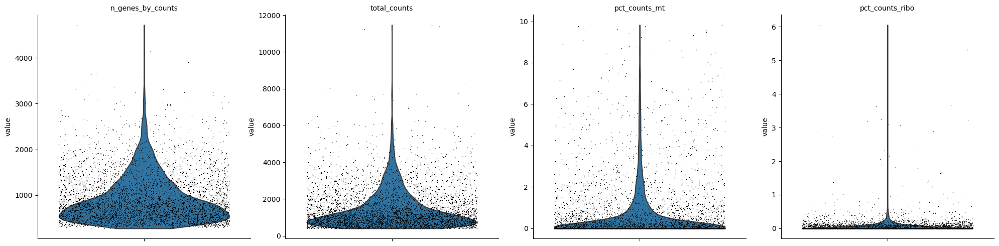

In [46]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo'], jitter=0.4, multi_panel=True)


#mtc. filter usually 5-20% -- here none >10

In [48]:
upper_lim = np.quantile(adata.obs.n_genes_by_counts.values, .98)
upper_lim

#filter out possible sequencing artifacts for high counts

2302.119999999999

In [49]:
adata = adata[adata.obs.n_genes_by_counts < upper_lim]
adata = adata[adata.obs.pct_counts_mt < 20] #unnecessary here
adata = adata[adata.obs.pct_counts_ribo <2]


In [50]:
adata.obs

,doublet,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo
CCTCAACCATACAGGG-1_1,False,2276,5434.0,38.0,0.699301,0.0,0.000000
ATACTTCCAAGGTCTT-1_1,False,2122,5252.0,1.0,0.019040,4.0,0.076161
GGGTCACTCTATTCGT-1_1,False,2286,5056.0,0.0,0.000000,1.0,0.019778
GATGATCCACAACCGC-1_1,False,2263,4938.0,2.0,0.040502,2.0,0.040502
TCATGCCGTCTTTCAT-1_1,False,2234,4993.0,0.0,0.000000,3.0,0.060084
...,...,...,...,...,...,...,...
CGCCATTGTTTGCCGG-1_1,False,355,410.0,3.0,0.731707,0.0,0.000000
CACTGGGGTCTACGTA-1_1,False,346,403.0,0.0,0.000000,0.0,0.000000
CATACTTGTAGAGGAA-1_1,False,360,410.0,2.0,0.487805,0.0,0.000000
TTTGGTTTCCACGGAC-1_1,False,299,405.0,0.0,0.000000,2.0,0.493827


In [51]:
adata

View of AnnData object with n_obs × n_vars = 5514 × 24126
    obs: 'doublet', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'

## Normalisation
variation between cells must be normalised to compare cells

In [52]:
adata.X.sum(axis=1)
#shows total counts per cell1

ArrayView([5433., 5250., 5050., ...,  410.,  405.,  410.], dtype=float32)

In [53]:
sc.pp.normalize_total(adata, target_sum=1e4) #norm to 10k UMI

/home/jared/mambaforge/envs/scvi-env/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [54]:
adata.X.sum(axis=1)

array([10000., 10000., 10000., ..., 10000., 10000., 10000.], dtype=float32)

In [55]:
sc.pp.log1p(adata) #change to log counts

In [56]:
adata.X.sum(axis=1)

array([3285.3794, 2858.1602, 3197.634 , ..., 1191.2706, 1022.7511,
       1162.8784], dtype=float32)

freeze adata now before filtering variable genes, regressing & scaling data

In [57]:
adata.raw = adata

## Clustering

In [58]:
sc.pp.highly_variable_genes(adata, n_top_genes= 2000)

In [59]:
adata.var

,mt,ribo,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,n_cells,highly_variable,means,dispersions,dispersions_norm
AL627309.1,False,False,4,0.000709,99.929116,4.0,4,True,0.009595,2.873558,1.580916
AL627309.5,False,False,28,0.004962,99.503810,28.0,28,False,0.029683,2.289220,-0.188518
AL627309.4,False,False,4,0.000709,99.929116,4.0,4,False,0.002519,1.702826,-1.964177
LINC01409,False,False,237,0.045543,95.800106,257.0,237,False,0.268913,2.327331,-0.073114
FAM87B,False,False,6,0.001063,99.893674,6.0,6,False,0.007222,1.947623,-1.222907
...,...,...,...,...,...,...,...,...,...,...,...
AL354822.1,False,False,120,0.021974,97.873472,124.0,120,False,0.157380,2.411086,0.180506
AL592183.1,False,False,866,0.181641,84.653553,1025.0,866,False,0.868133,2.514048,-0.383563
AC240274.1,False,False,143,0.026227,97.465887,148.0,143,False,0.152729,2.300313,-0.154927
AC007325.4,False,False,4,0.000709,99.929116,4.0,4,False,0.003027,1.579820,-2.336652


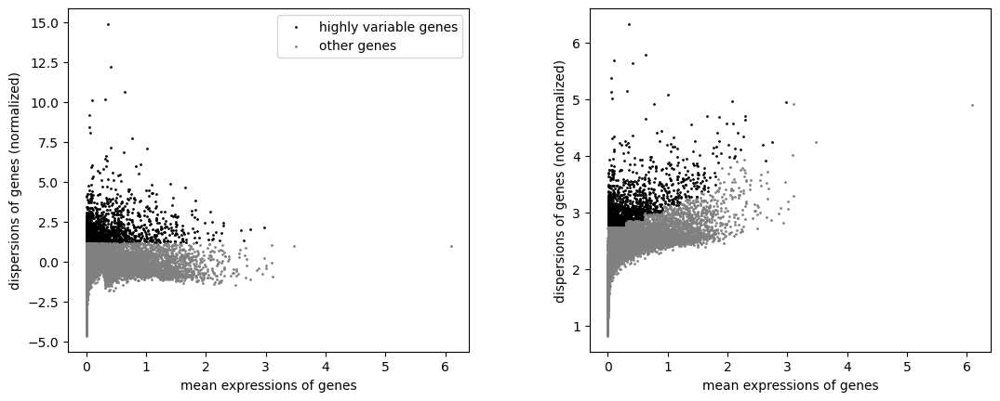

In [60]:
sc.pl.highly_variable_genes(adata) #effective dim reduction

In [61]:
adata = adata[:, adata.var.highly_variable]
adata

View of AnnData object with n_obs × n_vars = 5514 × 2000
    obs: 'doublet', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'

In [62]:
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt', 'pct_counts_ribo'])
#get rid of variations due to processing & sample quality

In [63]:
sc.pp.scale(adata, max_value=10)

In [64]:
sc.tl.pca(adata, svd_solver='arpack')

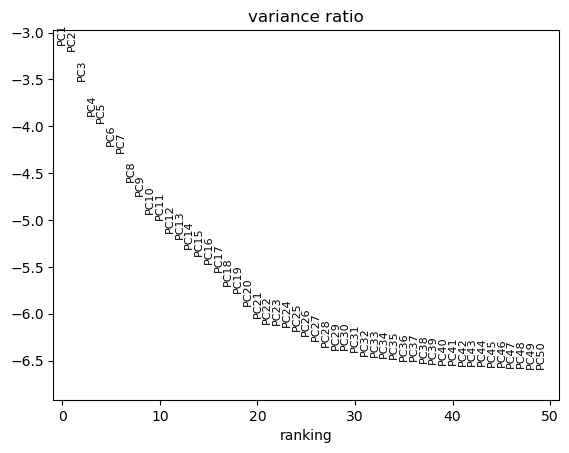

In [65]:
sc.pl.pca_variance_ratio(adata, log=True, n_pcs = 50)

In [66]:
sc.pp.neighbors(adata, n_pcs = 30) #can see elbow of above is ~30

In [67]:
adata #notice 'obsp' with distances and connectivities attributes

AnnData object with n_obs × n_vars = 5514 × 2000
    obs: 'doublet', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors'
    obsm: 'X_pca'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [68]:
adata.obsp['connectivities']

<5514x5514 sparse matrix of type '<class 'numpy.float32'>'
	with 113794 stored elements in Compressed Sparse Row format>

In [69]:
adata.obsp['connectivities'].toarray() #cell x cell matrix with vals for connection between cells
adata.obsp['distances'].toarray()

array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 4.15030813, ..., 0.        , 0.        ,
        0.        ],
       [0.        , 4.15030813, 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ]])

In [70]:
sc.tl.umap(adata)

/home/jared/mambaforge/envs/scvi-env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  cax = scatter(


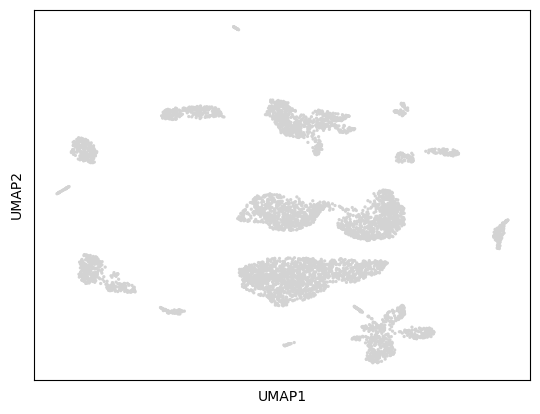

In [71]:
sc.pl.umap(adata)

In [73]:
pip install leidenalg

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 759.8 kB/s eta 0:00:00m eta 0:00:010:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 410.5 kB/s eta 0:00:00m eta 0:00:010:00:01
Note: you may need to restart the kernel to use updated packages.


In [74]:
sc.tl.leiden(adata, resolution=0.5) #1 -> more clusters, 0 -> fewer

/home/jared/mambaforge/envs/scvi-env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


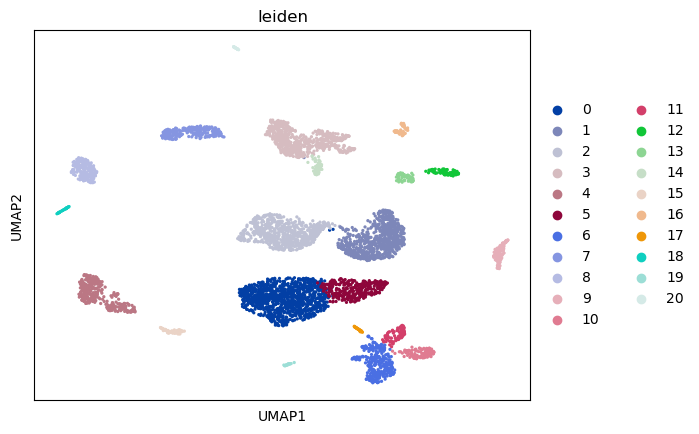

In [75]:
sc.pl.umap(adata, color=['leiden'])

# All samples

## Integration
(for when you have multiple samples

In [2]:
#label ribosomal genes (using list of known genes from Broad)

ribo_url = "http://software.broadinstitute.org/gsea/msigdb/download_geneset.jsp?geneSetName=KEGG_RIBOSOME&fileType=txt"
ribo_genes = pd.read_table(ribo_url, skiprows=2, header=None)


In [3]:
def pp(csv_path):
    adata = sc.read_csv(csv_path).T 
    sc.pp.filter_genes(adata, min_cells=10)
    sc.pp.highly_variable_genes(adata, n_top_genes=2000, subset=True, flavor='seurat_v3')
    scvi.model.SCVI.setup_anndata(adata)
    vae = scvi.model.SCVI(adata)
    vae.train(max_epochs=400)
    solo = scvi.external.SOLO.from_scvi_model(vae)
    solo.train()
    df = solo.predict()
    df['prediction'] = solo.predict(soft = False)
    df.index = df.index.map(lambda x: x[:-2])
    df['dif'] = df.doublet - df.singlet
    doublets = df[(df.prediction == 'doublet') & (df.dif > 1)]
    
    adata = sc.read_csv(csv_path).T
    adata.obs['Sample'] = csv_path.split('_')[2] #add new 'sample' col using the 3rd el of the str --> 'c19_data/GSM5226574_C51ctr_raw_counts.csv'
    adata.obs['doublet'] = adata.obs.index.isin(doublets.index)
    adata = adata[~adata.obs.doublet]
    
    sc.pp.filter_cells(adata, min_genes=200)
    #sc.pp.filter_genes(adata, min_cells=3)
    adata.var['mt'] = adata.var.index.str.startswith('MT-')
    adata.var['ribo'] = adata.var_names.isin(ribo_genes[0].values)
    sc.pp.calculate_qc_metrics(adata, qc_vars=['mt', 'ribo'], percent_top=None, log1p=False, inplace=True)
    upper_lim = np.quantile(adata.obs.n_genes_by_counts.values, .98)
    adata = adata[adata.obs.n_genes_by_counts < upper_lim]
    adata = adata[adata.obs.pct_counts_mt < 20]
    adata = adata[adata.obs.pct_counts_ribo <2]
    
    return adata
    
    
    
    

In [60]:
#generate list of adata obj

for file in os.listdir('c19_data'):
    out.append(pp('c19_data/' + file))

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 400/400: 100%|███████| 400/400 [01:00<00:00,  6.70it/s, loss=419, v_num=1]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|███████| 400/400 [01:00<00:00,  6.64it/s, loss=419, v_num=1]
INFO     Creating doublets, preparing SOLO model.                                                                  


/home/jared/mambaforge/envs/scvi-env/lib/python3.10/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 187/400:  47%|██▎  | 187/400 [00:31<00:35,  5.99it/s, loss=0.339, v_num=1]
Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.333. Signaling Trainer to stop.


/home/jared/mambaforge/envs/scvi-env/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:140: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['n_genes'] = number
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 400/400: 100%|███████| 400/400 [02:37<00:00,  2.51it/s, loss=345, v_num=1]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|███████| 400/400 [02:37<00:00,  2.54it/s, loss=345, v_num=1]
INFO     Creating doublets, preparing SOLO model.                                                                  


/home/jared/mambaforge/envs/scvi-env/lib/python3.10/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 136/400:  34%|█▋   | 136/400 [01:01<01:58,  2.22it/s, loss=0.311, v_num=1]
Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.299. Signaling Trainer to stop.


/home/jared/mambaforge/envs/scvi-env/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:140: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['n_genes'] = number
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 400/400: 100%|███████| 400/400 [01:06<00:00,  6.07it/s, loss=303, v_num=1]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|███████| 400/400 [01:06<00:00,  5.98it/s, loss=303, v_num=1]
INFO     Creating doublets, preparing SOLO model.                                                                  


/home/jared/mambaforge/envs/scvi-env/lib/python3.10/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 229/400:  57%|██▊  | 229/400 [00:43<00:32,  5.25it/s, loss=0.198, v_num=1]
Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.210. Signaling Trainer to stop.


/home/jared/mambaforge/envs/scvi-env/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:140: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['n_genes'] = number
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 400/400: 100%|███████| 400/400 [01:22<00:00,  4.92it/s, loss=322, v_num=1]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|███████| 400/400 [01:22<00:00,  4.86it/s, loss=322, v_num=1]
INFO     Creating doublets, preparing SOLO model.                                                                  


/home/jared/mambaforge/envs/scvi-env/lib/python3.10/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 258/400:  64%|███▏ | 258/400 [00:58<00:32,  4.38it/s, loss=0.306, v_num=1]
Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.291. Signaling Trainer to stop.


/home/jared/mambaforge/envs/scvi-env/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:140: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['n_genes'] = number


In [62]:
for i, adata in enumerate(out):
    adata.write(f'/home/jared/Documents/cs/comp-bio/adata/adata{i+24}.h5ad')

/home/jared/mambaforge/envs/scvi-env/lib/python3.10/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


In [12]:
for i in range(10):
    # reload the AnnData object from the h5ad file
    adata = sc.read(f'/home/jared/Documents/cs/comp-bio/adata/adata{i+11}.h5ad')
    
    # add the AnnData object to the list
    out.append(adata)

In [9]:
out

[AnnData object with n_obs × n_vars = 3986 × 34546
     obs: 'Sample', 'doublet', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo'
     var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts',
 AnnData object with n_obs × n_vars = 5471 × 34546
     obs: 'Sample', 'doublet', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo'
     var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts',
 AnnData object with n_obs × n_vars = 3920 × 34546
     obs: 'Sample', 'doublet', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo'
     var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts',
 AnnData object with n_obs × n_vars = 5077 × 34546
     obs: 'Sample', 'doublet', 

In [13]:
adata = sc.concat(out)

In [4]:
adata

AnnData object with n_obs × n_vars = 41918 × 34546
    obs: 'Sample', 'doublet', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo'

In [5]:
adata.obs

,Sample,doublet,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo
CTGGTCTTCCATGCAA-1_2,C52ctr,False,2339,2339,7657.0,0.0,0.000000,2.0,0.026120
AGGATAAAGCCGCACT-1_2,C52ctr,False,2536,2536,7023.0,206.0,2.933219,18.0,0.256301
TACCTGCAGCATCCCG-1_2,C52ctr,False,2433,2433,6663.0,0.0,0.000000,6.0,0.090050
TATATCCAGCTCCCTT-1_2,C52ctr,False,2460,2460,6562.0,1.0,0.015239,5.0,0.076196
AACCACACACATTACG-1_2,C52ctr,False,2283,2283,6245.0,0.0,0.000000,3.0,0.048038
...,...,...,...,...,...,...,...,...,...
GTAGAGGTCAAAGGTA-1_10,L04cov,False,352,352,402.0,3.0,0.746269,6.0,1.492537
TTTGGAGCAGTTGTTG-1_10,L04cov,False,343,343,411.0,0.0,0.000000,0.0,0.000000
GGGACAACAAATACGA-1_10,L04cov,False,360,360,410.0,0.0,0.000000,0.0,0.000000
CTGTGGGAGAGTATAC-1_10,L04cov,False,349,349,407.0,0.0,0.000000,0.0,0.000000


ah I see, adata.X is dense! so could make it sparse

In [8]:
adata.X = csr_matrix(adata.X)

In [11]:
out = []

In [13]:
for i in range(26):
    # reload the AnnData object from the h5ad file
    adata = sc.read_h5ad(f'/home/jared/Documents/cs/comp-bio/adata/adata{i+1}.h5ad')
    adata.X = csr_matrix(adata.X)
    out.append(adata)

In [14]:
adata = sc.concat(out)

In [15]:
adata

AnnData object with n_obs × n_vars = 95770 × 34546
    obs: 'Sample', 'doublet', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo'

In [16]:
sc.pp.filter_genes(adata,min_cells=10)

In [17]:
adata

AnnData object with n_obs × n_vars = 95770 × 28959
    obs: 'Sample', 'doublet', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo'
    var: 'n_cells'

## Restart from here if needed

In [2]:
#adata.write_h5ad('/home/jared/Documents/cs/comp-bio/combined.h5ad')

In [2]:
adata = sc.read_h5ad('/home/jared/Documents/cs/comp-bio/combined.h5ad')

In [3]:
adata.X

<95770x28959 sparse matrix of type '<class 'numpy.float32'>'
	with 78119812 stored elements in Compressed Sparse Row format>

In [4]:
adata.obs.groupby('Sample').count()

,doublet,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo
Sample,,,,,,,,
C51ctr,5471,5471,5471,5471,5471,5471,5471,5471
C52ctr,3986,3986,3986,3986,3986,3986,3986,3986
C53ctr,6232,6232,6232,6232,6232,6232,6232,6232
C54ctr,3920,3920,3920,3920,3920,3920,3920,3920
C55ctr,5077,5077,5077,5077,5077,5077,5077,5077
C56ctr,3624,3624,3624,3624,3624,3624,3624,3624
C57ctr,4311,4311,4311,4311,4311,4311,4311,4311
L01cov,2684,2684,2684,2684,2684,2684,2684,2684
L03cov,3487,3487,3487,3487,3487,3487,3487,3487


In [8]:
#apply even stricter filter
sc.pp.filter_genes(adata, min_cells = 400) #for memory
sc.pp.filter_cells(adata, min_genes=400) #for memory

In [9]:
adata

AnnData object with n_obs × n_vars = 82310 × 15133
    obs: 'Sample', 'doublet', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo'
    var: 'n_cells'

In [10]:
#copy un-normed data ---> used for scvi later
adata.layers['counts'] = adata.X.copy() #can't remove this step as SCVI needs this layer

In [11]:
adata.layers['counts']

<82310x15133 sparse matrix of type '<class 'numpy.float32'>'
	with 71784146 stored elements in Compressed Sparse Row format>

In [12]:
sc.pp.normalize_total(adata, target_sum = 1e4)
sc.pp.log1p(adata)
#adata.raw = adata # I think this line is what is causing issues ---> copying all the raw. I will save this object and continue without it to see if I can fix the memomry error

In [13]:
adata.obs.head()


,Sample,doublet,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo
CTGGTCTTCCATGCAA-1_2,C52ctr,False,2271,2339,7657.0,0.0,0.000000,2.0,0.026120
AGGATAAAGCCGCACT-1_2,C52ctr,False,2455,2536,7023.0,206.0,2.933219,18.0,0.256301
TACCTGCAGCATCCCG-1_2,C52ctr,False,2367,2433,6663.0,0.0,0.000000,6.0,0.090050
TATATCCAGCTCCCTT-1_2,C52ctr,False,2394,2460,6562.0,1.0,0.015239,5.0,0.076196
AACCACACACATTACG-1_2,C52ctr,False,2204,2283,6245.0,0.0,0.000000,3.0,0.048038


since we have 90k cells and only 20k genes, we're okay -- rule of thumb is < half as many genes as cells is ideal

In [21]:
# adata.raw = adata

#this file is significantly larger (1.9GB) (I think because of the 'raw')
#adata.write_h5ad('/home/jared/Documents/cs/comp-bio/combinedpp.h5ad')

In [14]:
#if had fewer cells:

sc.pp.highly_variable_genes(adata, n_top_genes=10000, subset=True, layer = 'counts', flavor="seurat_v3", batch_key='Sample') 
#no batch_key if one sample

In [15]:
adata

AnnData object with n_obs × n_vars = 82310 × 10000
    obs: 'Sample', 'doublet', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo'
    var: 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'log1p', 'hvg'
    layers: 'counts'

In [16]:
#NB the adata I will now train with doesn't include a adata.raw for memory reasons

scvi.model.SCVI.setup_anndata(adata, layer = 'counts',
                             categorical_covariate_keys=['Sample'], #could add e.g. 'batch' and 'seq_technique'
                             continuous_covariate_keys=['pct_counts_mt', 'total_counts', 'pct_counts_ribo'])

In [17]:
model = scvi.model.SCVI(adata)

In [18]:
#model = scvi.model.SCVI.load('/home/jared/Documents/cs/comp-bio/trained_scvi.pkl', use_gpu=True)

In [19]:
model.train()

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 97/97: 100%|███████| 97/97 [09:35<00:00,  5.88s/it, loss=1.8e+03, v_num=1]

`Trainer.fit` stopped: `max_epochs=97` reached.


Epoch 97/97: 100%|███████| 97/97 [09:35<00:00,  5.93s/it, loss=1.8e+03, v_num=1]


In [20]:
model.save('/home/jared/Documents/cs/comp-bio/trained_scvi.pkl', save_anndata=True)
#adata = sc.read_h5ad('/home/jared/Documents/cs/comp-bio/adata.h5ad')

In [21]:
model.get_latent_representation().shape


(82310, 10)

In [23]:
adata.obsm['X_scVI'] = model.get_latent_representation()

In [25]:
model.get_normalized_expression()

,LINC01409,LINC01128,SAMD11,PLEKHN1,HES4,ISG15,TTLL10,SDF4,ACAP3,MXRA8,...,STEAP1B,IL6,CLEC5A,SLC25A37,WT1,MGAT4C,GREM1,ZFY-AS1,DDX3Y,NLGN4Y
CTGGTCTTCCATGCAA-1_2,0.000022,0.000014,5.596858e-07,0.000011,0.000009,0.000033,1.776706e-06,0.000015,0.000016,4.282644e-06,...,6.578784e-06,0.000060,1.067634e-06,4.862920e-06,3.786894e-07,7.307236e-07,4.012986e-08,8.382710e-07,0.000048,0.000029
AGGATAAAGCCGCACT-1_2,0.000027,0.000009,9.473113e-07,0.000009,0.000013,0.000036,4.969320e-06,0.000029,0.000016,3.394510e-06,...,2.739006e-06,0.000013,8.268602e-07,1.024916e-06,2.519589e-07,5.628274e-07,2.534070e-08,1.779625e-06,0.000048,0.000026
TACCTGCAGCATCCCG-1_2,0.000018,0.000008,5.567781e-07,0.000004,0.000006,0.000012,3.137717e-06,0.000018,0.000010,7.670037e-07,...,1.550627e-05,0.000015,4.305082e-07,1.318106e-06,7.964179e-08,1.256076e-06,2.130574e-08,2.201739e-06,0.000055,0.000034
TATATCCAGCTCCCTT-1_2,0.000022,0.000014,1.661237e-06,0.000003,0.000006,0.000015,3.900329e-06,0.000023,0.000013,1.527835e-06,...,2.145155e-05,0.000011,4.927129e-07,1.196876e-06,3.240891e-07,2.160300e-06,4.177285e-08,2.261063e-06,0.000047,0.000043
AACCACACACATTACG-1_2,0.000011,0.000010,5.967038e-07,0.000002,0.000004,0.000005,1.529686e-06,0.000008,0.000006,3.717498e-07,...,1.439753e-05,0.000008,1.106795e-07,1.886332e-06,5.586741e-08,1.126262e-06,6.507727e-09,2.612405e-06,0.000043,0.000045
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GGGTTATTCCGAGTGC-1_24,0.000018,0.000018,1.227330e-07,0.000005,0.000005,0.000003,8.818673e-07,0.000026,0.000014,6.169474e-07,...,7.334741e-06,0.000003,3.333227e-06,3.040644e-07,9.159821e-07,1.379591e-08,7.088855e-07,1.719265e-05,0.000116,0.000002
ATGAGTCAGCTAGCCC-1_24,0.000019,0.000041,2.901593e-06,0.000005,0.000018,0.000004,6.526572e-06,0.000024,0.000021,8.537942e-06,...,8.451148e-06,0.000004,4.033709e-07,1.468689e-06,3.408588e-06,6.434180e-05,9.072285e-06,2.062376e-05,0.000172,0.000050
TATCAGGAGAGGTTTA-1_24,0.000014,0.000007,1.154285e-05,0.000015,0.000010,0.000001,9.912502e-07,0.000014,0.000025,5.766914e-05,...,1.323749e-08,0.000039,9.330860e-09,6.102092e-08,1.311251e-04,8.255925e-08,3.247007e-04,3.311613e-06,0.000052,0.000075
AGGTTGTAGGTAACTA-1_24,0.000018,0.000019,1.416298e-06,0.000019,0.000028,0.000005,4.275986e-06,0.000086,0.000038,5.795042e-06,...,2.017542e-06,0.000003,7.376439e-06,8.867196e-07,4.784979e-06,1.035572e-07,1.483365e-05,1.764009e-05,0.000147,0.000006


In [108]:
gc.collect()

104062

In [ ]:
adata.layers['scvi_normalized'] = model.get_normalized_expression(library_size = 1e4)

In [3]:
sc.pp.neighbors(adata, use_rep = 'X_scVI')

In [4]:
sc.tl.umap(adata)
sc.tl.leiden(adata, resolution=0.99) #default 0.5 but increased to try separate CD4/CD8

/home/jared/mambaforge/envs/scvi-env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/jared/mambaforge/envs/scvi-env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


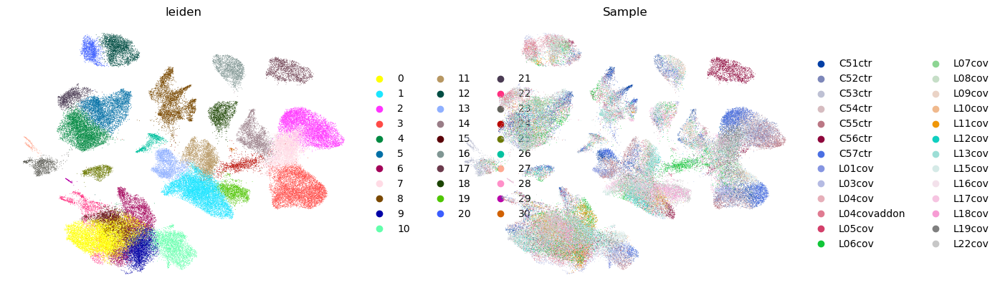

In [5]:
sc.pl.umap(adata, color = ['leiden', 'Sample'], frameon=False)

Nice clustering in Leiden, and looks like integration worked well except for c56ctr! --> could be additional cell type or something in that sample

can see that I have 1 fewer cluster than in tutorial -> possibly fitered out a rare subpop with my stricter filters earlier

In [33]:
adata.write_h5ad('integrated.h5ad')

In [8]:
adata = sc.read_h5ad('integrated.h5ad')

## Find markers / label cell types

In [9]:
#adata_raw = sc.read_h5ad('/home/jared/Documents/cs/comp-bio/combined.h5ad')


In [10]:
#repeating above steps but saving the raw

# sc.pp.filter_genes(adata_raw, min_cells = 400) #for memory
# sc.pp.filter_cells(adata_raw, min_genes=400) #for memory

# sc.pp.normalize_total(adata_raw, target_sum = 1e4)
# sc.pp.log1p(adata_raw)

# adata.raw = adata_raw

In [6]:
adata

AnnData object with n_obs × n_vars = 82310 × 10000
    obs: 'Sample', 'doublet', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', '_scvi_batch', '_scvi_labels', 'leiden'
    var: 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'Sample_colors', '_scvi_manager_uuid', '_scvi_uuid', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'umap'
    obsm: 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs', '_scvi_extra_continuous_covs'
    layers: 'counts', 'scvi_normalized'
    obsp: 'connectivities', 'distances'

In [8]:
sc.pp.log1p(adata)

In [9]:
#this should be on the adata.raw that I didn't save earlier for memory reasons. Will load that up now

sc.tl.rank_genes_groups(adata, 'leiden',use_raw=False)

/home/jared/mambaforge/envs/scvi-env/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/home/jared/mambaforge/envs/scvi-env/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/home/jared/mambaforge/envs/scvi-env/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:399: P

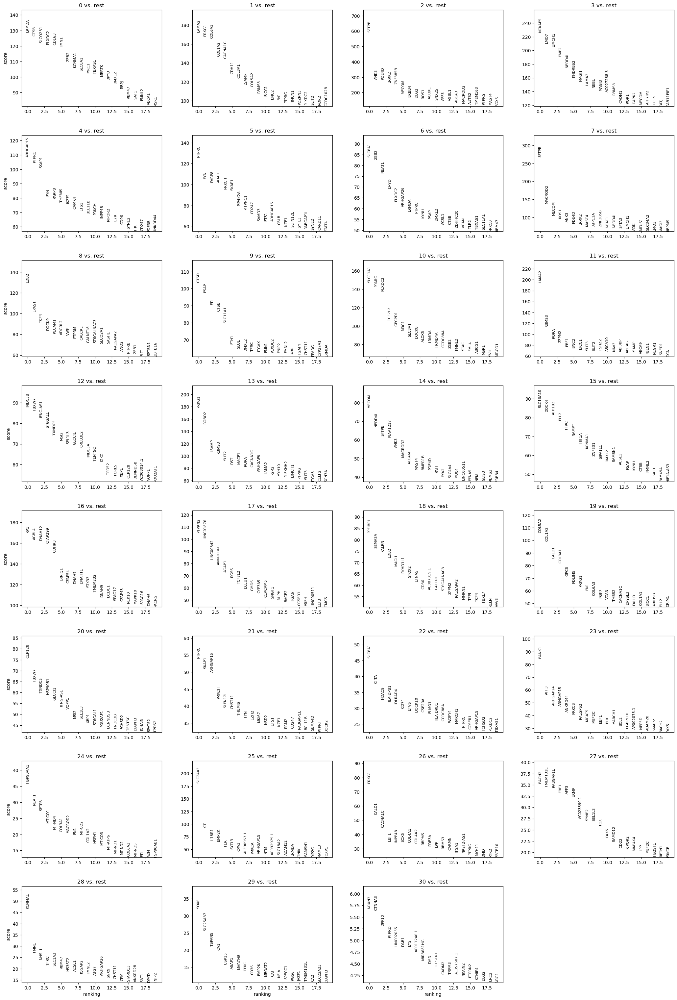

In [11]:
sc.pl.rank_genes_groups(adata, n_genes=20, sharey=False)

In [12]:
markers = sc.get.rank_genes_groups_df(adata,None)

In [13]:
markers

,group,names,scores,logfoldchanges,pvals,pvals_adj
0,0,LRMDA,128.975281,1.582801,0.0,0.0
1,0,CTSB,126.355942,3.197654,0.0,0.0
2,0,SLCO2B1,121.937614,3.688221,0.0,0.0
3,0,PLXDC2,121.196289,1.856094,0.0,0.0
4,0,CD163,120.597420,3.681030,0.0,0.0
...,...,...,...,...,...,...
309995,30,EZR,-152.897369,-28.268230,0.0,0.0
309996,30,ARHGEF7,-153.206726,-28.170826,0.0,0.0
309997,30,IRAK3,-162.415771,-28.399651,0.0,0.0
309998,30,HIPK3,-165.228882,-28.367331,0.0,0.0


In [14]:
markers = markers[(markers.pvals_adj < 0.05) & (markers.logfoldchanges > .5)]
markers

,group,names,scores,logfoldchanges,pvals,pvals_adj
0,0,LRMDA,128.975281,1.582801,0.000000,0.000000
1,0,CTSB,126.355942,3.197654,0.000000,0.000000
2,0,SLCO2B1,121.937614,3.688221,0.000000,0.000000
3,0,PLXDC2,121.196289,1.856094,0.000000,0.000000
4,0,CD163,120.597420,3.681030,0.000000,0.000000
...,...,...,...,...,...,...
300183,30,RGS6,2.422808,2.825092,0.020413,0.048143
300184,30,ADGRL2,2.419266,1.987923,0.020584,0.048535
300185,30,MATN2,2.419192,3.811298,0.020588,0.048535
300186,30,RIMS1,2.417632,3.773025,0.020664,0.048702


In [17]:
model = scvi.model.SCVI.load('/home/jared/Documents/cs/comp-bio/trained_scvi.pkl', adata=adata, use_gpu=True)

INFO     File /home/jared/Documents/cs/comp-bio/trained_scvi.pkl/model.pt already downloaded                       


In [18]:
markers_scvi = model.differential_expression(groupby = 'leiden')
markers_scvi

DE...: 100%|████████████████████████████████████| 31/31 [01:29<00:00,  2.87s/it]


,proba_de,proba_not_de,bayes_factor,scale1,scale2,pseudocounts,delta,lfc_mean,lfc_median,lfc_std,...,raw_mean1,raw_mean2,non_zeros_proportion1,non_zeros_proportion2,raw_normalized_mean1,raw_normalized_mean2,is_de_fdr_0.05,comparison,group1,group2
F13A1,0.9906,0.0094,4.657600,0.002239,0.000066,0.0,0.25,6.204491,6.287436,3.152533,...,1.850494,0.033842,0.406417,0.016465,25.628906,0.418734,True,0 vs Rest,0,Rest
IGSF21,0.9882,0.0118,4.427785,0.000201,0.000013,0.0,0.25,5.939417,6.083800,3.433296,...,0.162454,0.005906,0.095227,0.003810,2.345334,0.080892,True,0 vs Rest,0,Rest
CCL18,0.9874,0.0126,4.361378,0.000296,0.000079,0.0,0.25,7.009398,7.651991,4.468804,...,0.319127,0.105321,0.124589,0.031229,2.875707,0.791967,True,0 vs Rest,0,Rest
MERTK,0.9870,0.0130,4.329720,0.001981,0.000204,0.0,0.25,4.699575,4.841830,2.307561,...,1.564246,0.133511,0.612062,0.078447,18.962460,1.563914,True,0 vs Rest,0,Rest
FOLR2,0.9864,0.0136,4.283991,0.000038,0.000003,0.0,0.25,5.538251,5.654882,3.263918,...,0.032763,0.002123,0.030609,0.001919,0.389383,0.020989,True,0 vs Rest,0,Rest
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
PPP6C,0.5966,0.4034,0.391318,0.000087,0.000090,0.0,0.25,0.012239,0.024849,0.507284,...,0.078947,0.070450,0.078947,0.064943,1.933560,0.880822,False,30 vs Rest,30,Rest
NUP54,0.5922,0.4078,0.373068,0.000063,0.000069,0.0,0.25,-0.049475,-0.060823,0.470464,...,0.026316,0.061919,0.026316,0.057480,0.461681,0.758398,False,30 vs Rest,30,Rest
RTF1,0.5862,0.4138,0.348278,0.000111,0.000114,0.0,0.25,0.039903,0.039872,0.501486,...,0.184211,0.095873,0.157895,0.087782,3.385645,1.203249,False,30 vs Rest,30,Rest
ZSWIM8,0.5510,0.4490,0.204712,0.000063,0.000063,0.0,0.25,0.032702,0.005711,0.439023,...,0.026316,0.062697,0.026316,0.059133,0.756201,0.746571,False,30 vs Rest,30,Rest


In [19]:
markers_scvi = markers_scvi[(markers_scvi['is_de_fdr_0.05']) & (markers_scvi.lfc_mean > .5)]
markers_scvi

,proba_de,proba_not_de,bayes_factor,scale1,scale2,pseudocounts,delta,lfc_mean,lfc_median,lfc_std,...,raw_mean1,raw_mean2,non_zeros_proportion1,non_zeros_proportion2,raw_normalized_mean1,raw_normalized_mean2,is_de_fdr_0.05,comparison,group1,group2
F13A1,0.9906,0.0094,4.657600,0.002239,0.000066,0.0,0.25,6.204491,6.287436,3.152533,...,1.850494,0.033842,0.406417,0.016465,25.628906,0.418734,True,0 vs Rest,0,Rest
IGSF21,0.9882,0.0118,4.427785,0.000201,0.000013,0.0,0.25,5.939417,6.083800,3.433296,...,0.162454,0.005906,0.095227,0.003810,2.345334,0.080892,True,0 vs Rest,0,Rest
CCL18,0.9874,0.0126,4.361378,0.000296,0.000079,0.0,0.25,7.009398,7.651991,4.468804,...,0.319127,0.105321,0.124589,0.031229,2.875707,0.791967,True,0 vs Rest,0,Rest
MERTK,0.9870,0.0130,4.329720,0.001981,0.000204,0.0,0.25,4.699575,4.841830,2.307561,...,1.564246,0.133511,0.612062,0.078447,18.962460,1.563914,True,0 vs Rest,0,Rest
FOLR2,0.9864,0.0136,4.283991,0.000038,0.000003,0.0,0.25,5.538251,5.654882,3.263918,...,0.032763,0.002123,0.030609,0.001919,0.389383,0.020989,True,0 vs Rest,0,Rest
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CSRNP2,0.8998,0.1002,2.195004,0.000049,0.000025,0.0,0.25,1.178596,1.098854,0.955484,...,0.052632,0.023192,0.052632,0.022012,1.303750,0.259912,True,30 vs Rest,30,Rest
BRMS1L,0.8998,0.1002,2.195004,0.000056,0.000028,0.0,0.25,1.290694,1.216141,0.972204,...,0.026316,0.023751,0.026316,0.022268,0.568376,0.283302,True,30 vs Rest,30,Rest
TACC3,0.8998,0.1002,2.195004,0.000068,0.000058,0.0,0.25,1.499652,1.318597,2.125154,...,0.026316,0.044841,0.026316,0.038203,0.447547,0.569980,True,30 vs Rest,30,Rest
PTPRU,0.8998,0.1002,2.195004,0.000043,0.000022,0.0,0.25,3.013247,3.085852,3.042253,...,0.026316,0.022535,0.026316,0.020894,0.262895,0.234906,True,30 vs Rest,30,Rest


/home/jared/mambaforge/envs/scvi-env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


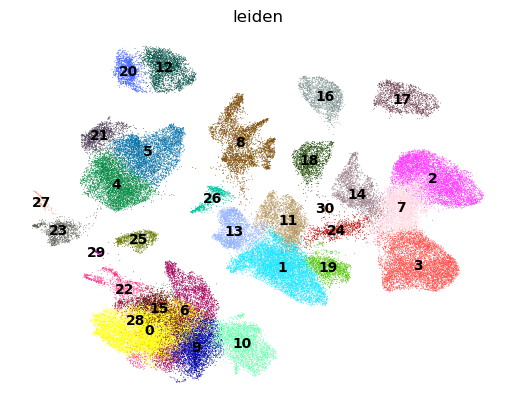

In [20]:
sc.pl.umap(adata, color = ['leiden'], frameon=False, legend_loc = "on data")

In [51]:
for x in range(0,20):
    print(f'"{x}":"",')

"0":"",
"1":"",
"2":"",
"3":"",
"4":"",
"5":"",
"6":"",
"7":"",
"8":"",
"9":"",
"10":"",
"11":"",
"12":"",
"13":"",
"14":"",
"15":"",
"16":"",
"17":"",
"18":"",
"19":"",


start with cell types you know will be in the dataset
almost every dataset will have blood cells
blood cells are also useful to know if you need to increase resolution of clustering

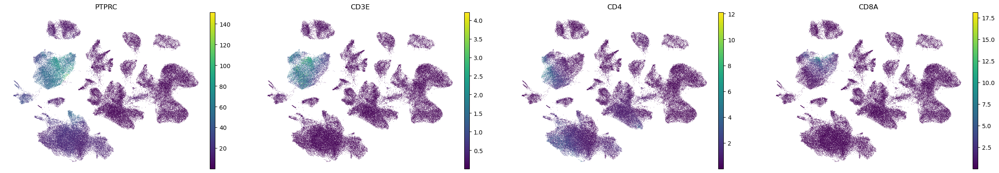

In [21]:
sc.pl.umap(adata, color=['PTPRC', 'CD3E', 'CD4', 'CD8A'], frameon=False, layer='scvi_normalized') #CD45, CD3 for T cells, CD4 + T cells

can see that CD4 & CD8 are not split at 0.5 & 0.85 resolution, so we need to increase resolution (limited by cell number, plus my stricter filtering!

In [22]:
markers[markers.names == 'CD4']

,group,names,scores,logfoldchanges,pvals,pvals_adj
483,0,CD4,25.445532,2.062199,3.417172e-138,1.373461e-137
40352,4,CD4,14.960130,1.647297,1.488427e-49,3.344781e-49
61223,6,CD4,7.295330,0.850578,3.540205e-13,6.142989e-13
101724,10,CD4,7.882759,0.954503,4.251744e-15,8.476364e-15
151087,15,CD4,5.110291,0.832514,3.514541e-07,5.702647e-07
211084,21,CD4,6.337073,1.250198,3.208594e-10,6.116267e-10
220505,22,CD4,8.088665,1.580151,1.430111e-15,4.984704e-15


In [23]:
markers[markers.names == 'CD8A']

,group,names,scores,logfoldchanges,pvals,pvals_adj
40729,4,CD8A,7.570922,1.974967,4.377627e-14,6.922243e-14
50284,5,CD8A,17.197948,4.720203,3.734476e-64,9.186902e-64
210734,21,CD8A,8.745997,3.500973,6.702600e-18,1.511978e-17


looks like cluster 4 is CD4+ and cluster 5 is CD8+

check PanglaoDB for labelling

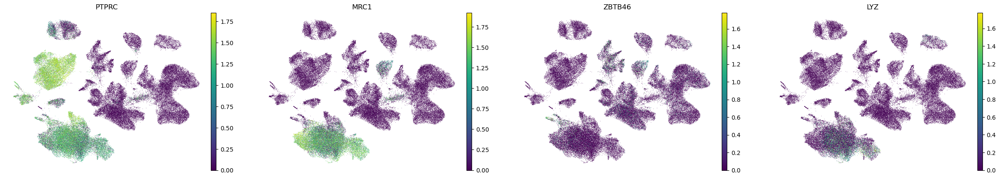

In [30]:
#looking for alveolar macs using MRC1
sc.pl.umap(adata, color=['PTPRC', 'MRC1', 'ZBTB46', 'LYZ'], frameon=False)
           #layer='scvi_normalized') #CD45, CD3 for T cells, CD4 + T cells

alveolar macs are similar to other myeloid cells so must find those too
label monocytes & dendritic cells then label everything else in that cluster as macs

DCs -- ZBTB46
Mono -- APOBEC3A (not in my adata, probs filtered out. LYZ instead

In [27]:
markers[markers.names == 'ZBTB46']
#looks like 22

,group,names,scores,logfoldchanges,pvals,pvals_adj
80308,8,ZBTB46,21.067724,2.330223,1.765510e-93,9.287267e-93
180302,18,ZBTB46,16.068905,2.512322,7.576532e-54,3.996061e-53
220082,22,ZBTB46,16.222059,2.869313,9.172522e-54,5.466342e-53
260603,26,ZBTB46,4.943083,1.274279,9.544090e-07,2.740979e-06


In [31]:
markers[markers.names == 'LYZ']
#Looks like 9,10

,group,names,scores,logfoldchanges,pvals,pvals_adj
717,0,LYZ,19.363478,1.461414,5.448206e-82,1.608089e-81
60245,6,LYZ,22.222795,2.298172,2.196726e-103,8.706803e-103
90292,9,LYZ,25.291288,2.582848,3.696135e-130,1.762582e-129
100263,10,LYZ,27.811871,2.985455,2.347369e-153,1.335250e-152
150459,15,LYZ,11.715885,1.710072,1.006103e-30,2.724352e-30
171773,17,LYZ,4.855086,0.814297,1.319924e-06,2.314844e-06
220735,22,LYZ,6.625876,1.238569,5.137553e-11,1.511045e-10


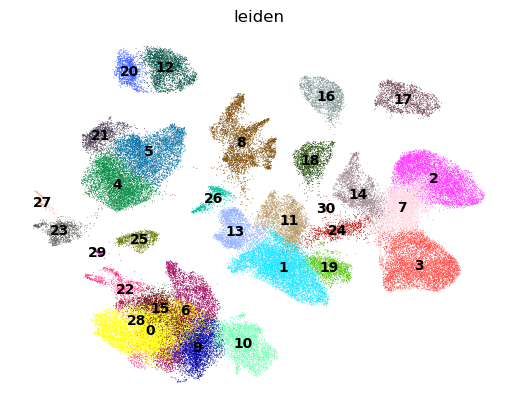

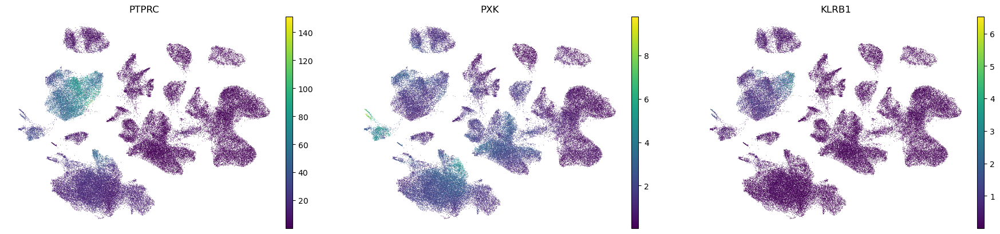

In [32]:
#B cells -- PXK
#NK cells -- KLRB1

sc.pl.umap(adata, color=['PTPRC', 'PXK', 'KLRB1'], frameon=False, layer='scvi_normalized')

NK cells look mixed in with CD8 cells - fix later

In [33]:
markers[markers.names == 'PXK']

,group,names,scores,logfoldchanges,pvals,pvals_adj
1242,0,PXK,11.613848,0.587103,5.440213e-31,1.093071e-30
11023,1,PXK,16.214224,0.856527,2.870813e-58,8.898987e-58
60668,6,PXK,12.944204,0.941460,1.305169e-37,3.204441e-37
91638,9,PXK,8.513968,0.631065,2.384312e-17,4.541288e-17
111166,11,PXK,7.732584,0.656736,1.445081e-14,3.421119e-14
150888,15,PXK,6.590407,0.669338,5.552465e-11,1.030907e-10
191027,19,PXK,5.884521,0.679616,4.883826e-09,9.896305e-09
210782,21,PXK,8.356876,1.023793,1.610766e-16,3.551855e-16
230231,23,PXK,8.904471,1.222499,2.052202e-18,4.918990e-18
270130,27,PXK,9.509990,2.566678,1.612893e-17,3.644956e-17


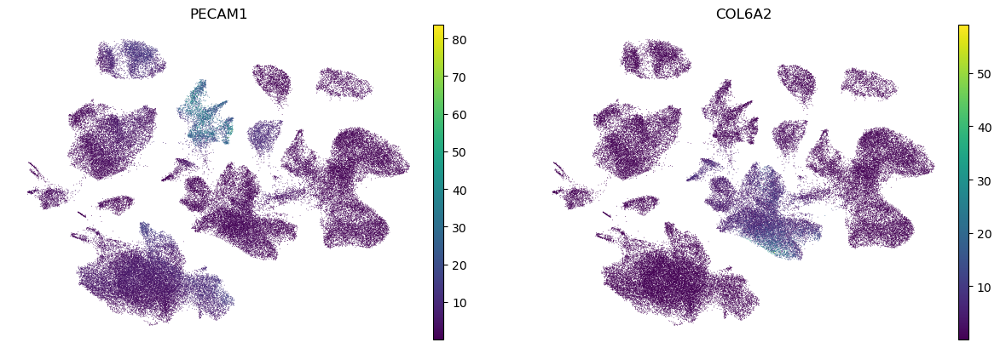

In [35]:
#endothelial cells - PECAM1
#fibroblasts - COL6A2

sc.pl.umap(adata, color=['PECAM1', 'COL6A2'], frameon=False, layer='scvi_normalized')

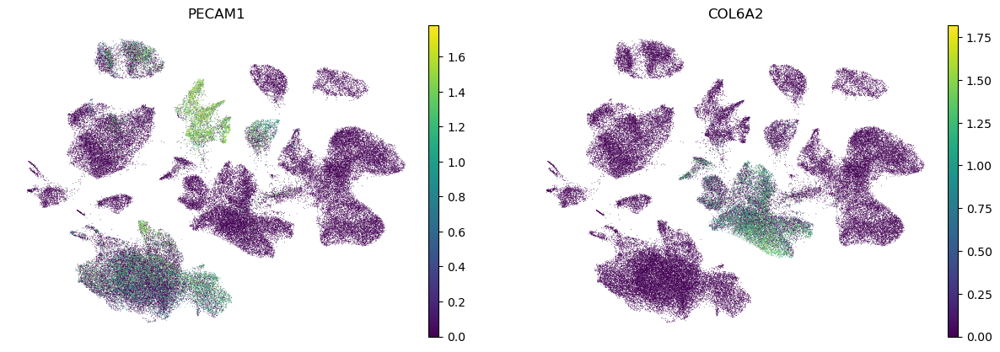

In [36]:
#endothelial cells - PECAM1
#fibroblasts

sc.pl.umap(adata, color=['PECAM1', 'COL6A2'], frameon=False)

#can also increase Vmax (upper limit of colour scale) instead of using un-normed layer

In [ ]:
#endothelial cells - PECAM1
#fibroblasts

sc.pl.umap(adata, color=['PECAM1', 'COL6A2'], frameon=False, layer='scvi_normalized')

In [37]:
markers[markers.names == 'COL6A2']

#Smooth muscle and fibroblasts can look similar -- as well as pericytes

,group,names,scores,logfoldchanges,pvals,pvals_adj
10064,1,COL6A2,65.111458,3.912006,0.000000e+00,0.000000e+00
110106,11,COL6A2,33.299519,2.928843,4.813156e-205,5.318405e-204
130357,13,COL6A2,16.575207,1.798874,1.986343e-58,7.283987e-58
190147,19,COL6A2,23.638481,2.785810,1.667279e-105,1.016633e-104
240413,24,COL6A2,3.090890,0.552124,2.046534e-03,4.799563e-03
260103,26,COL6A2,14.207422,2.492140,1.289346e-40,9.431939e-40


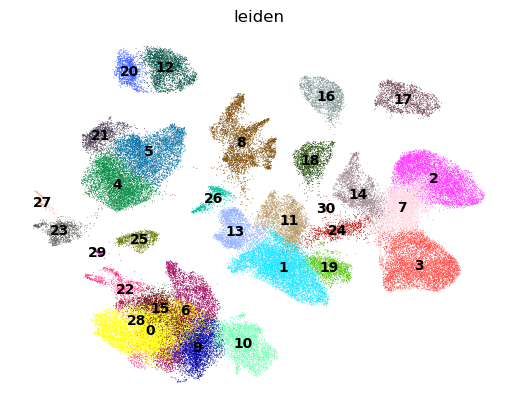

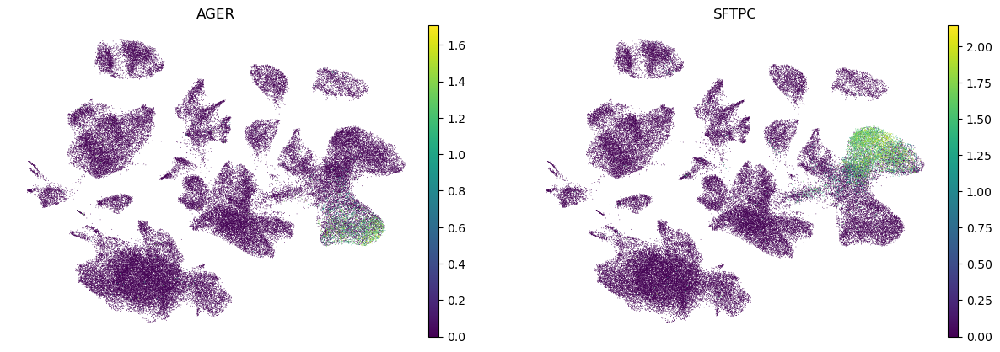

In [39]:
#alveolar t1 - AGER
#AT2 - SFTPC

sc.pl.umap(adata, color=['AGER', 'SFTPC'], frameon=False)

In [ ]:
#confirm by looking at logfold change in model - but if very apparent, and marker is specific for that cell, then can get away with it

In [40]:
markers[markers.names == 'SFTPC']

,group,names,scores,logfoldchanges,pvals,pvals_adj
20027,2,SFTPC,95.814255,5.764796,0.000000e+00,0.000000e+00
70137,7,SFTPC,33.873783,2.791515,2.136168e-221,2.381458e-220
240098,24,SFTPC,6.609161,1.096569,6.056841e-11,4.944360e-10


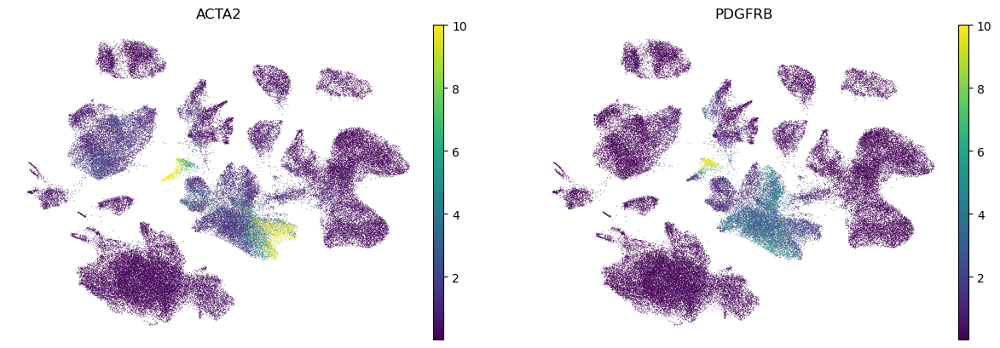

In [48]:
#smooth muscle - ACTA2
#pericyte - PDGFRB
sc.pl.umap(adata, color=['ACTA2', 'PDGFRB'], frameon=False,layer='scvi_normalized', vmax=10)


#SM & Pericyte similar and share ACTA2 -- can see 26 & 19 both have, but 26 has pericyte marker and 19 doesn't!

In [46]:
markers[markers.names == 'ACTA2']
#19

,group,names,scores,logfoldchanges,pvals,pvals_adj
10523,1,ACTA2,25.144608,2.350898,2.349756e-134,1.234764e-133
111382,11,ACTA2,6.412982,0.949081,1.663605e-10,3.478162e-10
130731,13,ACTA2,9.713902,1.598021,6.781424e-22,1.622738e-21
190113,19,ACTA2,26.439743,4.210522,5.499510e-127,3.827078e-126
260050,26,ACTA2,18.908978,4.150448,3.772057e-65,3.346989e-64


In [49]:
markers[markers.names == 'PDGFRB']
#26

,group,names,scores,logfoldchanges,pvals,pvals_adj
10216,1,PDGFRB,40.902802,3.549179,0.000000e+00,0.000000e+00
110201,11,PDGFRB,25.096272,3.089676,1.873868e-125,1.358860e-124
131396,13,PDGFRB,4.804615,0.753501,1.647329e-06,2.612321e-06
190516,19,PDGFRB,11.025681,1.974082,2.972522e-27,9.527315e-27
260027,26,PDGFRB,21.634943,4.240217,1.675422e-80,1.647416e-79


In [56]:
markers_scvi[markers_scvi.group1 == '25']

,proba_de,proba_not_de,bayes_factor,scale1,scale2,pseudocounts,delta,lfc_mean,lfc_median,lfc_std,...,raw_mean1,raw_mean2,non_zeros_proportion1,non_zeros_proportion2,raw_normalized_mean1,raw_normalized_mean2,is_de_fdr_0.05,comparison,group1,group2
AC004917.1,1.0000,0.0000,18.420681,0.001096,0.000023,0.0,0.25,6.139813,6.051558,1.735328,...,0.672355,0.007398,0.382070,0.006108,11.370590,0.084332,True,25 vs Rest,25,Rest
HPGDS,1.0000,0.0000,18.420681,0.001362,0.000006,0.0,0.25,10.187490,10.284334,2.749520,...,0.823902,0.003183,0.461046,0.002642,14.291289,0.038026,True,25 vs Rest,25,Rest
MS4A2,1.0000,0.0000,18.420681,0.001355,0.000004,0.0,0.25,9.936442,9.869795,2.422012,...,0.833507,0.000774,0.489861,0.000627,14.673723,0.009495,True,25 vs Rest,25,Rest
IL18R1,1.0000,0.0000,18.420681,0.005177,0.000096,0.0,0.25,7.925385,7.904074,2.948444,...,2.869798,0.043480,0.846318,0.034385,50.885948,0.751664,True,25 vs Rest,25,Rest
GATA2,1.0000,0.0000,18.420681,0.000926,0.000009,0.0,0.25,9.513797,9.745744,2.536443,...,0.514406,0.005383,0.358591,0.004842,9.285641,0.078283,True,25 vs Rest,25,Rest
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
DNAH9,0.9202,0.0798,2.445067,0.000006,0.000095,0.0,0.25,0.523954,0.660552,2.989199,...,0.002134,0.098877,0.002134,0.021223,0.046053,0.773978,True,25 vs Rest,25,Rest
UBOX5-AS1,0.9202,0.0798,2.445067,0.000100,0.000041,0.0,0.25,1.335846,1.325359,0.950169,...,0.068303,0.039547,0.059765,0.036302,1.178839,0.471494,True,25 vs Rest,25,Rest
STEAP3-AS1,0.9202,0.0798,2.445067,0.000009,0.000010,0.0,0.25,1.079660,0.993168,2.329683,...,0.003202,0.009782,0.003202,0.009143,0.066093,0.093284,True,25 vs Rest,25,Rest
RMDN2-AS1,0.9202,0.0798,2.445067,0.000067,0.000030,0.0,0.25,1.448744,1.420532,1.456081,...,0.029883,0.028302,0.028815,0.025094,0.549289,0.281384,True,25 vs Rest,25,Rest


HPGDS is microglia marker

In [54]:
markers[markers.names == 'CDK15']

,group,names,scores,logfoldchanges,pvals,pvals_adj
250020,25,CDK15,34.116386,8.82884,2.004477e-166,1.733977e-165


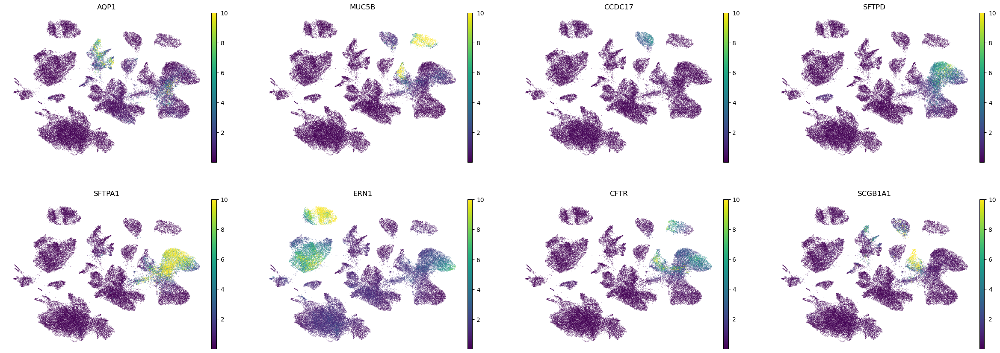

In [91]:
#airway epithelial -- AQP1, ADH7
#goblet cells - MUC5B
#Ciliated cells - CCDC17
sc.pl.umap(adata, color=['AQP1', 'MUC5B', 'CCDC17','SFTPD', 'SFTPA1', 'ERN1', 'CFTR', 'SCGB1A1'], frameon=False,layer='scvi_normalized', vmax=10)

In [92]:
markers[markers.names == 'AQP1']

,group,names,scores,logfoldchanges,pvals,pvals_adj
32209,3,AQP1,5.288910,0.649371,1.271546e-07,1.894155e-07
70411,7,AQP1,21.115318,2.886374,6.840875e-94,3.942868e-93
80134,8,AQP1,31.694141,4.395769,2.406225e-196,2.270024e-195
240523,24,AQP1,2.620157,0.774842,8.912171e-03,1.784576e-02


In [66]:
markers[markers.names == 'CCDC17']

,group,names,scores,logfoldchanges,pvals,pvals_adj
160363,16,CCDC17,26.893188,7.757331,5.150906e-135,3.291313e-134


In [63]:
markers_scvi[markers_scvi.group1 == '14']
#ERN2 is also goblet marker

#looks like 17 & 14 both look like goblet cells, but 17 is the sample that didn't get integrated out during data integration
#BUT Ionocyte markers CFTR & SCGB1A1 both cluster more in 14 and not really in 17

,proba_de,proba_not_de,bayes_factor,scale1,scale2,pseudocounts,delta,lfc_mean,lfc_median,lfc_std,...,raw_mean1,raw_mean2,non_zeros_proportion1,non_zeros_proportion2,raw_normalized_mean1,raw_normalized_mean2,is_de_fdr_0.05,comparison,group1,group2
ERN2,0.9970,0.0030,5.806135,0.000168,0.000011,0.0,0.25,7.104421,7.343566,3.033469,...,0.166812,0.010147,0.122271,0.007848,1.770638,0.112040,True,14 vs Rest,14,Rest
MS4A8,0.9968,0.0032,5.741396,0.000075,0.000016,0.0,0.25,6.991804,7.150625,3.295275,...,0.048035,0.019907,0.040175,0.012059,0.587512,0.156692,True,14 vs Rest,14,Rest
SMIM31,0.9966,0.0034,5.680571,0.000079,0.000005,0.0,0.25,5.257301,5.390614,2.096353,...,0.068559,0.003687,0.062009,0.003437,0.752230,0.039125,True,14 vs Rest,14,Rest
BPIFB1,0.9962,0.0038,5.568944,0.002136,0.000013,0.0,0.25,10.414666,10.438836,4.490599,...,2.895201,0.011797,0.319214,0.005424,29.213028,0.130118,True,14 vs Rest,14,Rest
PTPRT,0.9958,0.0042,5.468460,0.000294,0.000077,0.0,0.25,6.627812,6.819545,3.397200,...,0.111354,0.105861,0.055459,0.020182,1.263391,0.857526,True,14 vs Rest,14,Rest
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SDCBP2,0.9242,0.0758,2.500830,0.000029,0.000017,0.0,0.25,1.443843,1.495127,1.838200,...,0.017904,0.011172,0.015721,0.010372,0.227153,0.132377,True,14 vs Rest,14,Rest
EEF2,0.9242,0.0758,2.500830,0.000131,0.000078,0.0,0.25,1.226346,1.274130,2.181653,...,0.124017,0.075907,0.102620,0.057286,1.394838,0.735203,True,14 vs Rest,14,Rest
MRPS24,0.9242,0.0758,2.500830,0.000006,0.000005,0.0,0.25,0.993407,1.083194,2.213930,...,0.007424,0.005011,0.006987,0.004849,0.086703,0.047243,True,14 vs Rest,14,Rest
ATP2A1,0.9242,0.0758,2.500830,0.000021,0.000009,0.0,0.25,1.607362,1.651874,1.626193,...,0.018341,0.007148,0.018341,0.006773,0.225984,0.082873,True,14 vs Rest,14,Rest


In [71]:
markers_scvi[markers_scvi.group1 == '12']

#interesting from above umap -- ERN1 is marker of plasmacytoid DCs which apparently respond to viral infection

,proba_de,proba_not_de,bayes_factor,scale1,scale2,pseudocounts,delta,lfc_mean,lfc_median,lfc_std,...,raw_mean1,raw_mean2,non_zeros_proportion1,non_zeros_proportion2,raw_normalized_mean1,raw_normalized_mean2,is_de_fdr_0.05,comparison,group1,group2
IGHG4,0.9994,0.0006,7.417964,0.002060,0.000021,0.0,0.25,10.862001,11.030631,3.127351,...,1.692807,0.020198,0.214917,0.003036,26.217163,0.254994,True,12 vs Rest,12,Rest
IGHGP,0.9994,0.0006,7.417964,0.002869,0.000018,0.0,0.25,10.262009,10.335505,3.449270,...,3.382935,0.028165,0.287582,0.003601,43.877449,0.256935,True,12 vs Rest,12,Rest
IGHG3,0.9990,0.0010,6.906745,0.004999,0.000048,0.0,0.25,10.279044,10.350641,3.376853,...,6.166461,0.053833,0.413687,0.006586,81.584435,0.578186,True,12 vs Rest,12,Rest
IGHA1,0.9990,0.0010,6.906745,0.003840,0.000043,0.0,0.25,12.115968,12.183855,4.299638,...,5.470971,0.077281,0.397924,0.006398,81.875145,0.776200,True,12 vs Rest,12,Rest
IGHG1,0.9986,0.0014,6.569875,0.005051,0.000056,0.0,0.25,11.483966,11.448080,3.781908,...,4.618220,0.064861,0.464821,0.009735,64.934532,0.825411,True,12 vs Rest,12,Rest
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ERH,0.9158,0.0842,2.386603,0.000045,0.000021,0.0,0.25,1.377233,1.336336,1.303089,...,0.037293,0.022544,0.036524,0.021491,0.638185,0.250085,True,12 vs Rest,12,Rest
AC008937.2,0.9158,0.0842,2.386603,0.000067,0.000036,0.0,0.25,1.371592,1.343180,1.758682,...,0.038447,0.022896,0.036140,0.021742,0.697856,0.305173,True,12 vs Rest,12,Rest
PRKD2,0.9158,0.0842,2.386603,0.000237,0.000104,0.0,0.25,1.508548,1.702293,1.026168,...,0.118031,0.071199,0.103806,0.064911,1.999367,0.965462,True,12 vs Rest,12,Rest
MACC1-AS1,0.9158,0.0842,2.386603,0.000008,0.000012,0.0,0.25,1.242968,0.529112,3.237583,...,0.004998,0.014214,0.004998,0.012257,0.077017,0.131132,True,12 vs Rest,12,Rest


In [72]:
markers_scvi[markers_scvi.group1 == '20']
#can see that 12 & 20 both have plasma cell genes but cluster differently - could be interesting

,proba_de,proba_not_de,bayes_factor,scale1,scale2,pseudocounts,delta,lfc_mean,lfc_median,lfc_std,...,raw_mean1,raw_mean2,non_zeros_proportion1,non_zeros_proportion2,raw_normalized_mean1,raw_normalized_mean2,is_de_fdr_0.05,comparison,group1,group2
IGHG4,0.9984,0.0016,6.436144,0.000840,0.000065,0.0,0.25,9.228794,9.505891,3.398547,...,1.160062,0.055446,0.135671,0.007692,14.199405,0.862818,True,20 vs Rest,20,Rest
SHCBP1,0.9982,0.0018,6.318161,0.000637,0.000017,0.0,0.25,6.630207,6.757409,2.076612,...,0.422256,0.010729,0.294207,0.009185,4.647518,0.124282,True,20 vs Rest,20,Rest
MYBL2,0.9982,0.0018,6.318161,0.000363,0.000009,0.0,0.25,7.219370,7.252208,2.351667,...,0.336128,0.006778,0.265244,0.005864,4.047658,0.084018,True,20 vs Rest,20,Rest
IGLC1,0.9980,0.0020,6.212601,0.001613,0.000092,0.0,0.25,9.290456,9.229614,3.823118,...,2.217228,0.101546,0.180640,0.008753,27.354584,1.441196,True,20 vs Rest,20,Rest
IGHGP,0.9980,0.0020,6.212601,0.000836,0.000086,0.0,0.25,7.859002,7.949907,3.893171,...,1.637197,0.109830,0.173780,0.009963,14.297615,1.430243,True,20 vs Rest,20,Rest
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
IL20RB,0.9086,0.0914,2.296659,0.000020,0.000008,0.0,0.25,1.550717,1.448124,1.283573,...,0.016768,0.008457,0.014482,0.008000,0.180175,0.100674,True,20 vs Rest,20,Rest
TSPYL2,0.9086,0.0914,2.296659,0.000069,0.000068,0.0,0.25,0.811523,0.705440,1.886187,...,0.026677,0.042654,0.025915,0.036964,0.344766,0.557750,True,20 vs Rest,20,Rest
AC002069.2,0.9086,0.0914,2.296659,0.000015,0.000015,0.0,0.25,0.759782,0.804892,1.678918,...,0.010671,0.007235,0.009146,0.005790,0.125183,0.066886,True,20 vs Rest,20,Rest
TLNRD1,0.9086,0.0914,2.296659,0.000026,0.000019,0.0,0.25,1.034695,1.108162,1.592902,...,0.025915,0.018494,0.023628,0.016828,0.236211,0.194206,True,20 vs Rest,20,Rest


In [74]:
markers_scvi[markers_scvi.group1 == '18']
#RELN is neural & endothelial
#STAB2 & SEMA3A is endothelial

,proba_de,proba_not_de,bayes_factor,scale1,scale2,pseudocounts,delta,lfc_mean,lfc_median,lfc_std,...,raw_mean1,raw_mean2,non_zeros_proportion1,non_zeros_proportion2,raw_normalized_mean1,raw_normalized_mean2,is_de_fdr_0.05,comparison,group1,group2
RELN,1.0000,0.0000,18.420681,0.002042,0.000005,0.0,0.25,12.198232,12.511439,3.294125,...,2.204319,0.001127,0.638381,0.000990,23.439091,0.017138,True,18 vs Rest,18,Rest
STAB2,1.0000,0.0000,18.420681,0.000587,0.000003,0.0,0.25,9.176993,9.196836,2.390250,...,0.413837,0.001226,0.203655,0.001139,4.327282,0.017136,True,18 vs Rest,18,Rest
SEMA3A,1.0000,0.0000,18.420681,0.003879,0.000061,0.0,0.25,8.558797,8.576771,3.449153,...,4.349236,0.028139,0.809399,0.020699,44.410324,0.318294,True,18 vs Rest,18,Rest
STK32B,0.9998,0.0002,8.516943,0.000849,0.000028,0.0,0.25,6.216747,6.208237,2.370744,...,0.939292,0.019944,0.415144,0.016230,9.642565,0.231606,True,18 vs Rest,18,Rest
TBX1,0.9996,0.0004,7.823621,0.000703,0.000015,0.0,0.25,6.823206,6.505939,2.470481,...,0.710832,0.009136,0.415796,0.008591,7.492554,0.102040,True,18 vs Rest,18,Rest
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ARHGAP31-AS1,0.9222,0.0778,2.472621,0.000019,0.000017,0.0,0.25,1.082821,1.028200,2.149476,...,0.026762,0.018310,0.026110,0.017096,0.235678,0.202069,True,18 vs Rest,18,Rest
SDC3,0.9222,0.0778,2.472621,0.000046,0.000043,0.0,0.25,2.092801,1.482361,3.108706,...,0.048956,0.044814,0.044386,0.035926,0.458623,0.460488,True,18 vs Rest,18,Rest
AC007666.2,0.9222,0.0778,2.472621,0.000011,0.000012,0.0,0.25,1.295263,0.993185,2.638695,...,0.008486,0.011724,0.008486,0.011142,0.101157,0.124212,True,18 vs Rest,18,Rest
DTNA,0.9222,0.0778,2.472621,0.000136,0.000253,0.0,0.25,0.838982,-0.120007,3.294432,...,0.015666,0.199031,0.013708,0.117804,0.209234,2.065111,True,18 vs Rest,18,Rest


In [93]:
markers_scvi[markers_scvi.group1 == '21']

,proba_de,proba_not_de,bayes_factor,scale1,scale2,pseudocounts,delta,lfc_mean,lfc_median,lfc_std,...,raw_mean1,raw_mean2,non_zeros_proportion1,non_zeros_proportion2,raw_normalized_mean1,raw_normalized_mean2,is_de_fdr_0.05,comparison,group1,group2
MCM10,0.9978,0.0022,6.117091,0.000131,0.000005,0.0,0.25,6.548147,6.541811,2.503057,...,0.117783,0.004345,0.107005,0.003962,1.684740,0.045641,True,21 vs Rest,21,Rest
CCNF,0.9976,0.0024,6.029880,0.000381,0.000019,0.0,0.25,5.082252,5.101527,1.887277,...,0.220170,0.012208,0.177059,0.010739,2.846014,0.136384,True,21 vs Rest,21,Rest
KIF15,0.9976,0.0024,6.029880,0.000584,0.000017,0.0,0.25,6.546533,6.614951,2.206554,...,0.382602,0.010542,0.280216,0.008801,5.134950,0.122298,True,21 vs Rest,21,Rest
NEIL3,0.9976,0.0024,6.029880,0.000434,0.000011,0.0,0.25,7.042644,7.034846,2.508357,...,0.266359,0.005320,0.199384,0.004333,3.299182,0.056329,True,21 vs Rest,21,Rest
FANCI,0.9974,0.0026,5.949637,0.000811,0.000054,0.0,0.25,4.509429,4.560076,1.471258,...,0.615857,0.033983,0.403387,0.028515,8.559122,0.433425,True,21 vs Rest,21,Rest
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ATP5F1B,0.9154,0.0846,2.381427,0.000025,0.000018,0.0,0.25,0.598387,0.662989,2.023554,...,0.027714,0.021046,0.026174,0.019257,0.424017,0.219999,True,21 vs Rest,21,Rest
AL359220.1,0.9154,0.0846,2.381427,0.000055,0.000030,0.0,0.25,1.800067,1.598204,2.048559,...,0.043880,0.028983,0.038491,0.025318,0.602117,0.369255,True,21 vs Rest,21,Rest
POU2F2,0.9154,0.0846,2.381427,0.000150,0.000117,0.0,0.25,1.440176,1.471706,1.979236,...,0.120092,0.074154,0.099307,0.057017,1.576745,1.142749,True,21 vs Rest,21,Rest
PLXDC1,0.9154,0.0846,2.381427,0.000030,0.000028,0.0,0.25,1.105241,0.946240,2.238721,...,0.009238,0.013529,0.009238,0.012492,0.147204,0.194884,True,21 vs Rest,21,Rest


In [80]:
for item in markers_scvi[markers_scvi.group1 == '21'][0:1000].index:
    print(item)
    
#for https://david.ncifcrf.gov/tools.jsp

MCM10
CCNF
KIF15
NEIL3
FANCI
CHEK1
KIF4A
INCENP
ASPM
KIFC1
SGO1
NSD2
MKI67
CDCA2
CKAP2L
GTSE1
RRM2
MELK
DNA2
ARHGAP11B
EZH2
CDC25C
KNL1
PRR11
ASF1B
FAM111B
TACC3
NCAPG2
FBXO5
KIF18A
SHCBP1
PCLAF
CLSPN
TICRR
PRC1-AS1
SMC2
SGO2
CENPK
CENPI
CENPF
NDC80
CENPE
ATAD2
NCAPH
RRM1
STIL
ANLN
E2F2
DLGAP5
KIF11
NCAPG
RAD54L
BUB1B
HJURP
PRC1
WDR62
ESCO2
KIF14
TOP2A
CCDC150
KIF18B
NUSAP1
CCNA2
PLK4
POLE2
AC091057.6
KIF22
BUB1
FANCD2
CIT
AC130324.2
FOXM1
DEPDC1B
TTK
LMNB1
XRCC2
ARHGAP11A
E2F7
CDCA8
CIP2A
CDK1
DTL
TPX2
NCAPD3
LIG1
WDR76
WDHD1
DNMT1
KIF2C
RECQL4
CHAF1A
MYBL2
EXO1
RAD51AP1
RACGAP1
H2AFX
POLQ
SPC24
AURKB
STMN1
BRIP1
PARPBP
AURKA
KIF23
MND1
GINS1
HMMR
NCAPD2
PIF1
HAUS8
BARD1
CDC7
FANCM
MCM3
CEP55
BRCA1
FANCA
NKG7
VRK1
SASS6
RBL1
NUF2
DBF4B
HELLS
TOPBP1
MCM8
KIF20B
ATAD5
E2F8
ANP32B
POLE
SUV39H2
CEP128
ANP32E
RAD54B
PCNA
LRP8
TMPO
C21orf58
CCL5
POLA1
GZMB
GNLY
MMS22L
KLRK1
ZGRF1
CEP152
ZWILCH
CHAF1B
CENPU
DDX11
FANCD2OS
DDIAS
ORC6
SMC4
GZMA
NDC1
HIST1H4C
CD8A
AC016074.2
MXD3
BLM
BORA
ARHGA

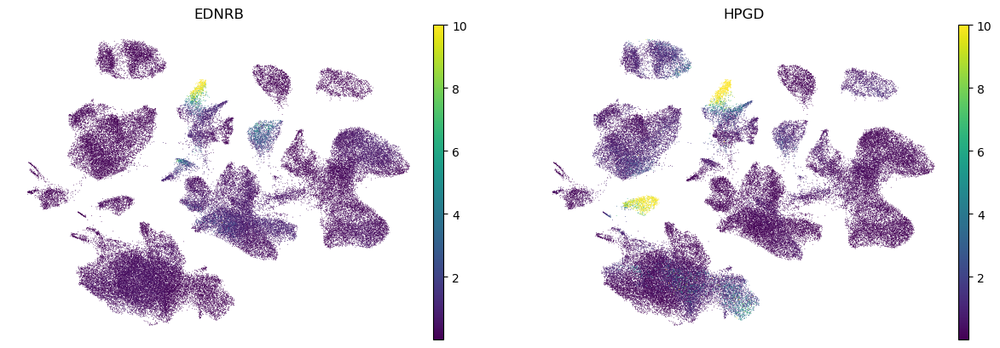

In [87]:
sc.pl.umap(adata, color=['EDNRB','HPGD'], frameon=False,layer='scvi_normalized', vmax=10)

#Looks like top of cluster 8 might be aerocytes

In [88]:
markers_scvi[markers_scvi.group1 == '13']

,proba_de,proba_not_de,bayes_factor,scale1,scale2,pseudocounts,delta,lfc_mean,lfc_median,lfc_std,...,raw_mean1,raw_mean2,non_zeros_proportion1,non_zeros_proportion2,raw_normalized_mean1,raw_normalized_mean2,is_de_fdr_0.05,comparison,group1,group2
ROBO2,0.9982,0.0018,6.318161,0.008459,0.000291,0.0,0.25,8.930096,9.267191,4.029614,...,9.224782,0.258217,0.931034,0.072283,111.095062,2.668862,True,13 vs Rest,13,Rest
ADAMTS8,0.9976,0.0024,6.029880,0.000297,0.000007,0.0,0.25,7.068194,7.159297,2.631264,...,0.179834,0.003762,0.129638,0.003212,2.307673,0.040902,True,13 vs Rest,13,Rest
GRIA1,0.9972,0.0028,5.875328,0.000949,0.000023,0.0,0.25,8.271552,8.381800,3.475116,...,0.620686,0.010685,0.353994,0.007936,8.595101,0.118095,True,13 vs Rest,13,Rest
AC012349.1,0.9968,0.0032,5.741396,0.000811,0.000020,0.0,0.25,7.120127,7.163464,2.971694,...,0.493669,0.009485,0.254911,0.007786,5.922407,0.104272,True,13 vs Rest,13,Rest
ACTN2,0.9960,0.0040,5.517450,0.000118,0.000007,0.0,0.25,5.441767,5.527009,2.272469,...,0.103012,0.004249,0.089044,0.003662,1.341791,0.049613,True,13 vs Rest,13,Rest
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
PDLIM2,0.9210,0.0790,2.456012,0.000040,0.000024,0.0,0.25,1.272003,1.207569,2.340931,...,0.028808,0.020170,0.027935,0.019020,0.387927,0.225031,True,13 vs Rest,13,Rest
DSTN,0.9208,0.0792,2.453266,0.000193,0.000183,0.0,0.25,1.053458,1.157693,1.825884,...,0.189000,0.216101,0.149716,0.130369,2.342065,2.124352,True,13 vs Rest,13,Rest
ZDHHC14,0.9208,0.0792,2.453266,0.000431,0.000217,0.0,0.25,1.572986,1.567261,1.443158,...,0.290702,0.166491,0.217372,0.111386,3.802865,2.124764,True,13 vs Rest,13,Rest
TRIP10,0.9208,0.0792,2.453266,0.000167,0.000055,0.0,0.25,1.968483,1.940491,1.581190,...,0.141860,0.044865,0.122654,0.041690,2.159685,0.523823,True,13 vs Rest,13,Rest


In [94]:
markers_scvi[markers_scvi.group1 == '29']

,proba_de,proba_not_de,bayes_factor,scale1,scale2,pseudocounts,delta,lfc_mean,lfc_median,lfc_std,...,raw_mean1,raw_mean2,non_zeros_proportion1,non_zeros_proportion2,raw_normalized_mean1,raw_normalized_mean2,is_de_fdr_0.05,comparison,group1,group2
CLK3,1.0000,0.0000,18.420681,0.001456,0.000045,0.0,0.25,5.014070,5.056573,1.058846,...,0.760000,0.034339,0.360000,0.033271,16.737371,0.425891,True,29 vs Rest,29,Rest
CA1,1.0000,0.0000,18.420681,0.009358,0.000029,0.0,0.25,8.936914,9.004230,1.927559,...,4.746665,0.022083,0.853333,0.019238,101.051842,0.221356,True,29 vs Rest,29,Rest
AC010615.2,1.0000,0.0000,18.420681,0.000841,0.000019,0.0,0.25,6.085196,6.021082,1.653187,...,0.373333,0.015176,0.266667,0.014009,9.017282,0.161119,True,29 vs Rest,29,Rest
SSX2IP,1.0000,0.0000,18.420681,0.000690,0.000021,0.0,0.25,5.135908,5.171861,1.355901,...,0.386667,0.015249,0.293333,0.014240,8.710570,0.176374,True,29 vs Rest,29,Rest
ERMAP,1.0000,0.0000,18.420681,0.000446,0.000029,0.0,0.25,4.016335,4.023018,1.096837,...,0.346667,0.023432,0.253333,0.022424,8.003683,0.251924,True,29 vs Rest,29,Rest
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CNTNAP1,0.9088,0.0912,2.299070,0.000020,0.000017,0.0,0.25,1.079195,0.995726,1.843927,...,0.013333,0.011516,0.013333,0.011054,0.219660,0.132041,True,29 vs Rest,29,Rest
NSD3,0.9088,0.0912,2.299070,0.000777,0.000413,0.0,0.25,1.031617,1.085853,0.629072,...,0.360000,0.328925,0.306667,0.256132,7.741261,4.184074,True,29 vs Rest,29,Rest
RGS3,0.9088,0.0912,2.299070,0.000068,0.000051,0.0,0.25,1.356566,1.109608,2.242279,...,0.000000,0.035616,0.000000,0.031641,0.000000,0.420516,True,29 vs Rest,29,Rest
IDH2,0.9086,0.0914,2.296659,0.000076,0.000048,0.0,0.25,1.234937,1.246091,1.546386,...,0.066667,0.039993,0.066667,0.036931,1.376164,0.507273,True,29 vs Rest,29,Rest


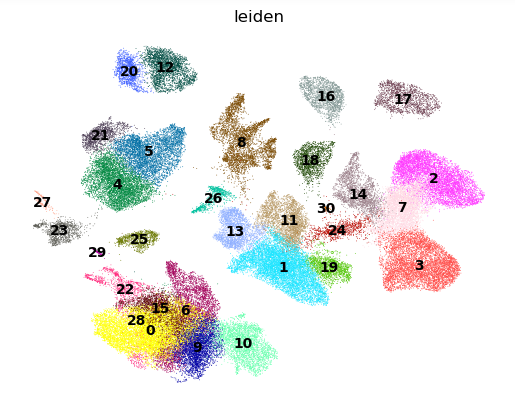

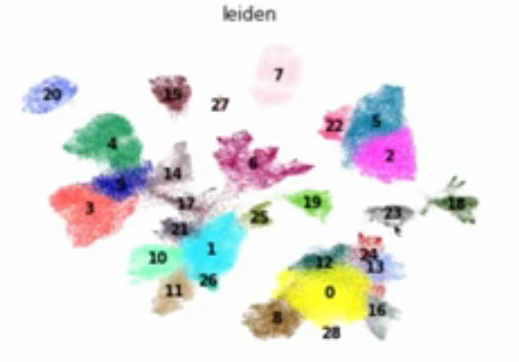

In [97]:
cell_type = {"0":"Macrophage",
"1":"Fibroblast",
"2":"Alveolar Type 2",
"3":"Alveolar Type 1",
"4":"CD4+ T-cell",
"5":"CD8+ T-cell",
"6":"Macrophage",
"7":"Alveolar Type 2",
"8":"Airway epithelial cell",
"9":"Macrophage",
"10":"Monocyte",
"11":"Fibroblast",
"12":"Plasma Cell",
"13":"Fibroblasts",
"14":"Goblet Cell // airway epi",
"15":"Macrophage",
"16":"Ciliated cell // airway epi",
"17":"Goblet Cell // airway epi",
"18":"Endothelial cell",
"19":"Smooth Muscle",
"20":"Plasma Cell",
"21":"Cycling T/NK cell",
"22":"Dendritic Cell",
"23":"B-cell",
"24":"Airway epithelial",
"25":"?Neural tissue",
"26":"Pericyte",
"27":"B-cell",
"28":"Macrophage",
"29":"Dendritic cell",
"30":"Airway epithelial",
}

In [96]:
adata.obs

,Sample,doublet,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo,_scvi_batch,_scvi_labels,leiden,_scvi_raw_norm_scaling
CTGGTCTTCCATGCAA-1_2,C52ctr,False,2271,2339,7657.0,0.0,0.000000,2.0,0.026120,0,0,2,1.971220
AGGATAAAGCCGCACT-1_2,C52ctr,False,2455,2536,7023.0,206.0,2.933219,18.0,0.256301,0,0,2,2.024292
TACCTGCAGCATCCCG-1_2,C52ctr,False,2367,2433,6663.0,0.0,0.000000,6.0,0.090050,0,0,2,2.222222
TATATCCAGCTCCCTT-1_2,C52ctr,False,2394,2460,6562.0,1.0,0.015239,5.0,0.076196,0,0,2,2.298851
AACCACACACATTACG-1_2,C52ctr,False,2204,2283,6245.0,0.0,0.000000,3.0,0.048038,0,0,2,2.275313
...,...,...,...,...,...,...,...,...,...,...,...,...,...
GGGTTATTCCGAGTGC-1_24,L18cov,False,407,414,478.0,2.0,0.418410,0.0,0.000000,0,0,0,38.461540
ATGAGTCAGCTAGCCC-1_24,L18cov,False,408,418,456.0,0.0,0.000000,0.0,0.000000,0,0,18,36.231884
TATCAGGAGAGGTTTA-1_24,L18cov,False,402,405,458.0,3.0,0.655022,0.0,0.000000,0,0,19,31.948881
AGGTTGTAGGTAACTA-1_24,L18cov,False,405,408,474.0,2.0,0.421941,1.0,0.210970,0,0,9,40.983604


In [98]:
adata.obs.leiden.map(cell_type)

CTGGTCTTCCATGCAA-1_2      Alveolar Type 2
AGGATAAAGCCGCACT-1_2      Alveolar Type 2
TACCTGCAGCATCCCG-1_2      Alveolar Type 2
TATATCCAGCTCCCTT-1_2      Alveolar Type 2
AACCACACACATTACG-1_2      Alveolar Type 2
                               ...       
GGGTTATTCCGAGTGC-1_24          Macrophage
ATGAGTCAGCTAGCCC-1_24    Endothelial cell
TATCAGGAGAGGTTTA-1_24       Smooth Muscle
AGGTTGTAGGTAACTA-1_24          Macrophage
AATCGACAGGTAAGTT-1_24          Macrophage
Name: leiden, Length: 82310, dtype: object

In [100]:
adata.obs['cell type'] = adata.obs.leiden.map(cell_type)

/home/jared/mambaforge/envs/scvi-env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


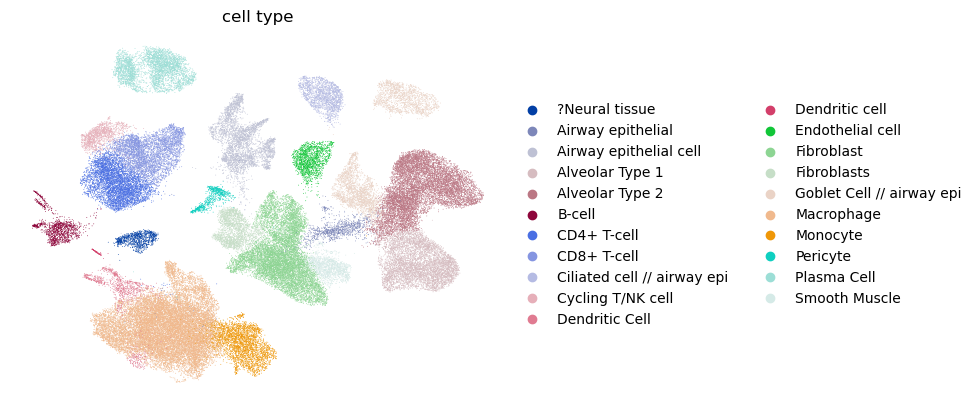

In [103]:
sc.pl.umap(adata, color = ['cell type'], frameon=False) #legend_loc = "on data")

In [104]:
adata.uns['scvi_markers'] = markers_scvi
adata.uns['markers'] = markers

In [106]:
adata.write_h5ad('labelled.h5ad')
model.save('model.model')

## Counting Cells

In [18]:
adata = sc.read_h5ad('labelled.h5ad')

In [19]:
adata.obs.Sample.unique().tolist()

['C52ctr',
 'C51ctr',
 'C54ctr',
 'C55ctr',
 'C53ctr',
 'L01cov',
 'C57ctr',
 'C56ctr',
 'L03cov',
 'L04cov',
 'L04covaddon',
 'L07cov',
 'L08cov',
 'L05cov',
 'L06cov',
 'L12cov',
 'L11cov',
 'L09cov',
 'L10cov',
 'L17cov',
 'L15cov',
 'L16cov',
 'L13cov',
 'L19cov',
 'L22cov',
 'L18cov']

In [20]:
def map_condition(x):
    if 'cov' in x:
        return 'COVID19'
    else:
        return 'control'

In [21]:
adata.obs['condition'] = adata.obs.Sample.map(map_condition)
adata.obs

,Sample,doublet,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo,_scvi_batch,_scvi_labels,leiden,_scvi_raw_norm_scaling,cell type,condition
CTGGTCTTCCATGCAA-1_2,C52ctr,False,2271,2339,7657.0,0.0,0.000000,2.0,0.026120,0,0,2,1.971220,Alveolar Type 2,control
AGGATAAAGCCGCACT-1_2,C52ctr,False,2455,2536,7023.0,206.0,2.933219,18.0,0.256301,0,0,2,2.024292,Alveolar Type 2,control
TACCTGCAGCATCCCG-1_2,C52ctr,False,2367,2433,6663.0,0.0,0.000000,6.0,0.090050,0,0,2,2.222222,Alveolar Type 2,control
TATATCCAGCTCCCTT-1_2,C52ctr,False,2394,2460,6562.0,1.0,0.015239,5.0,0.076196,0,0,2,2.298851,Alveolar Type 2,control
AACCACACACATTACG-1_2,C52ctr,False,2204,2283,6245.0,0.0,0.000000,3.0,0.048038,0,0,2,2.275313,Alveolar Type 2,control
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GGGTTATTCCGAGTGC-1_24,L18cov,False,407,414,478.0,2.0,0.418410,0.0,0.000000,0,0,0,38.461540,Macrophage,COVID19
ATGAGTCAGCTAGCCC-1_24,L18cov,False,408,418,456.0,0.0,0.000000,0.0,0.000000,0,0,18,36.231884,Endothelial cell,COVID19
TATCAGGAGAGGTTTA-1_24,L18cov,False,402,405,458.0,3.0,0.655022,0.0,0.000000,0,0,19,31.948881,Smooth Muscle,COVID19
AGGTTGTAGGTAACTA-1_24,L18cov,False,405,408,474.0,2.0,0.421941,1.0,0.210970,0,0,9,40.983604,Macrophage,COVID19


In [22]:
adata.obs.groupby(['Sample']).count()

,doublet,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo,_scvi_batch,_scvi_labels,leiden,_scvi_raw_norm_scaling,cell type,condition
Sample,,,,,,,,,,,,,,
C51ctr,4924,4924,4924,4924,4924,4924,4924,4924,4924,4924,4924,4924,4924,4924
C52ctr,3553,3553,3553,3553,3553,3553,3553,3553,3553,3553,3553,3553,3553,3553
C53ctr,5367,5367,5367,5367,5367,5367,5367,5367,5367,5367,5367,5367,5367,5367
C54ctr,3203,3203,3203,3203,3203,3203,3203,3203,3203,3203,3203,3203,3203,3203
C55ctr,3852,3852,3852,3852,3852,3852,3852,3852,3852,3852,3852,3852,3852,3852
C56ctr,3150,3150,3150,3150,3150,3150,3150,3150,3150,3150,3150,3150,3150,3150
C57ctr,3780,3780,3780,3780,3780,3780,3780,3780,3780,3780,3780,3780,3780,3780
L01cov,2145,2145,2145,2145,2145,2145,2145,2145,2145,2145,2145,2145,2145,2145
L03cov,3378,3378,3378,3378,3378,3378,3378,3378,3378,3378,3378,3378,3378,3378


In [23]:
num_tot_cells = adata.obs.groupby(['Sample']).count()
num_tot_cells = dict(zip(num_tot_cells.index, num_tot_cells.doublet)) #can count this as it is False for doublets, counted in total
num_tot_cells

{'C51ctr': 4924,
 'C52ctr': 3553,
 'C53ctr': 5367,
 'C54ctr': 3203,
 'C55ctr': 3852,
 'C56ctr': 3150,
 'C57ctr': 3780,
 'L01cov': 2145,
 'L03cov': 3378,
 'L04cov': 2683,
 'L04covaddon': 3756,
 'L05cov': 2157,
 'L06cov': 4665,
 'L07cov': 3891,
 'L08cov': 3137,
 'L09cov': 2567,
 'L10cov': 1098,
 'L11cov': 2289,
 'L12cov': 2779,
 'L13cov': 3810,
 'L15cov': 3080,
 'L16cov': 1362,
 'L17cov': 3365,
 'L18cov': 1624,
 'L19cov': 1902,
 'L22cov': 4793}

In [24]:
cell_type_counts = adata.obs.groupby(['Sample', 'condition', 'cell type']).count()
cell_type_counts = cell_type_counts.rename(columns={'doublet':'cell_count'})
cell_type_counts = cell_type_counts[cell_type_counts.sum(axis = 1) >0].reset_index()
cell_type_counts = cell_type_counts[cell_type_counts.columns[:4]]
cell_type_counts

,Sample,condition,cell type,cell_count
0,C51ctr,control,?Neural tissue,140
1,C51ctr,control,Airway epithelial,4
2,C51ctr,control,Airway epithelial cell,480
3,C51ctr,control,Alveolar Type 1,718
4,C51ctr,control,Alveolar Type 2,618
...,...,...,...,...
503,L22cov,COVID19,Macrophage,1464
504,L22cov,COVID19,Monocyte,6
505,L22cov,COVID19,Pericyte,49
506,L22cov,COVID19,Plasma Cell,405


In [25]:
cell_type_counts['total_cells'] = cell_type_counts.Sample.map(num_tot_cells).astype(int)
cell_type_counts['frequency'] = cell_type_counts.cell_count / cell_type_counts.total_cells
cell_type_counts

,Sample,condition,cell type,cell_count,total_cells,frequency
0,C51ctr,control,?Neural tissue,140,4924,0.028432
1,C51ctr,control,Airway epithelial,4,4924,0.000812
2,C51ctr,control,Airway epithelial cell,480,4924,0.097482
3,C51ctr,control,Alveolar Type 1,718,4924,0.145816
4,C51ctr,control,Alveolar Type 2,618,4924,0.125508
...,...,...,...,...,...,...
503,L22cov,COVID19,Macrophage,1464,4793,0.305445
504,L22cov,COVID19,Monocyte,6,4793,0.001252
505,L22cov,COVID19,Pericyte,49,4793,0.010223
506,L22cov,COVID19,Plasma Cell,405,4793,0.084498


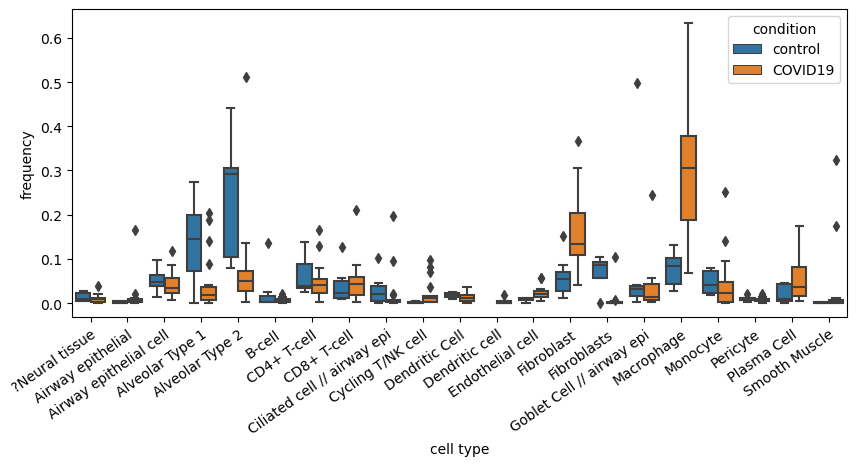

In [26]:
plt.figure(figsize = (10,4))
ax = sns.boxplot(data = cell_type_counts, x = 'cell type', y = 'frequency',hue = 'condition')
plt.xticks(rotation=35, rotation_mode='anchor', ha='right')
plt.show()

## Differential expression

the authors subsetted airway epithelium into goblet/mucus/basal etc. I started to get into that already based on the fairly strong goblet cell markers I found in my UMap

In [27]:
subset = adata[adata.obs['cell type'].isin(['Alveolar Type 1', 'Alveolar Type 2'])].copy()

authors just used seurat 'find markers' for their DE. Pseudobulk is preferred - SCVI, diffxpy

diffxpy preferred to SCVI if you cut down genes a lot in SCVI model (e.g. down to 3k) or if you didn't make an SCVI model to begin with

In [13]:
#diffxpy requires dense tensor 
subset.X = subset.X.toarray()

#trying without this to fix the div by zero error didn't work

In [28]:
len(subset.var)

10000

In [29]:
subset

AnnData object with n_obs × n_vars = 15411 × 10000
    obs: 'Sample', 'doublet', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', '_scvi_batch', '_scvi_labels', 'leiden', '_scvi_raw_norm_scaling', 'cell type', 'condition'
    var: 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'Sample_colors', '_scvi_manager_uuid', '_scvi_uuid', 'cell type_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'markers', 'neighbors', 'rank_genes_groups', 'scvi_markers', 'umap'
    obsm: 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs', '_scvi_extra_continuous_covs'
    layers: 'counts', 'scvi_normalized'
    obsp: 'connectivities', 'distances'

In [31]:
subset.obs

,Sample,doublet,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo,_scvi_batch,_scvi_labels,leiden,_scvi_raw_norm_scaling,cell type,condition
CTGGTCTTCCATGCAA-1_2,C52ctr,False,2271,2339,7657.0,0.0,0.000000,2.0,0.026120,0,0,2,1.971220,Alveolar Type 2,control
AGGATAAAGCCGCACT-1_2,C52ctr,False,2455,2536,7023.0,206.0,2.933219,18.0,0.256301,0,0,2,2.024292,Alveolar Type 2,control
TACCTGCAGCATCCCG-1_2,C52ctr,False,2367,2433,6663.0,0.0,0.000000,6.0,0.090050,0,0,2,2.222222,Alveolar Type 2,control
TATATCCAGCTCCCTT-1_2,C52ctr,False,2394,2460,6562.0,1.0,0.015239,5.0,0.076196,0,0,2,2.298851,Alveolar Type 2,control
AACCACACACATTACG-1_2,C52ctr,False,2204,2283,6245.0,0.0,0.000000,3.0,0.048038,0,0,2,2.275313,Alveolar Type 2,control
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AGGGCCTAGATGAACT-1_24,L18cov,False,417,422,528.0,11.0,2.083333,0.0,0.000000,0,0,7,27.624310,Alveolar Type 2,COVID19
GTACAACCATGACGAG-1_24,L18cov,False,403,406,505.0,5.0,0.990099,0.0,0.000000,0,0,7,30.487804,Alveolar Type 2,COVID19
TAGATCGCAGCCTTCT-1_24,L18cov,False,402,405,501.0,1.0,0.199601,1.0,0.199601,0,0,7,33.898304,Alveolar Type 2,COVID19
GCACATAAGATGAACT-1_24,L18cov,False,425,431,499.0,1.0,0.200401,0.0,0.000000,0,0,7,31.545742,Alveolar Type 2,COVID19


In [32]:
subset.obs = subset.obs.rename(columns = {'cell type':'cell_type'})

In [33]:
subset.obs

,Sample,doublet,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo,_scvi_batch,_scvi_labels,leiden,_scvi_raw_norm_scaling,cell_type,condition
CTGGTCTTCCATGCAA-1_2,C52ctr,False,2271,2339,7657.0,0.0,0.000000,2.0,0.026120,0,0,2,1.971220,Alveolar Type 2,control
AGGATAAAGCCGCACT-1_2,C52ctr,False,2455,2536,7023.0,206.0,2.933219,18.0,0.256301,0,0,2,2.024292,Alveolar Type 2,control
TACCTGCAGCATCCCG-1_2,C52ctr,False,2367,2433,6663.0,0.0,0.000000,6.0,0.090050,0,0,2,2.222222,Alveolar Type 2,control
TATATCCAGCTCCCTT-1_2,C52ctr,False,2394,2460,6562.0,1.0,0.015239,5.0,0.076196,0,0,2,2.298851,Alveolar Type 2,control
AACCACACACATTACG-1_2,C52ctr,False,2204,2283,6245.0,0.0,0.000000,3.0,0.048038,0,0,2,2.275313,Alveolar Type 2,control
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AGGGCCTAGATGAACT-1_24,L18cov,False,417,422,528.0,11.0,2.083333,0.0,0.000000,0,0,7,27.624310,Alveolar Type 2,COVID19
GTACAACCATGACGAG-1_24,L18cov,False,403,406,505.0,5.0,0.990099,0.0,0.000000,0,0,7,30.487804,Alveolar Type 2,COVID19
TAGATCGCAGCCTTCT-1_24,L18cov,False,402,405,501.0,1.0,0.199601,1.0,0.199601,0,0,7,33.898304,Alveolar Type 2,COVID19
GCACATAAGATGAACT-1_24,L18cov,False,425,431,499.0,1.0,0.200401,0.0,0.000000,0,0,7,31.545742,Alveolar Type 2,COVID19


In [34]:
#subset = subset.raw.to_adata() #need to run this if data was scaled/regressed and there are negative numbers
#but we used scvi for our downstream clustering so should be okay

In [30]:
subset.write_h5ad('subset.h5ad')

In [39]:
subset = sc.read_h5ad('subset.h5ad')

In [10]:
#subset.raw = subset

#trying to add a (false) raw dim to see if this fixes div by zero error with diffxpy

In [4]:
subset

AnnData object with n_obs × n_vars = 15411 × 10000
    obs: 'Sample', 'doublet', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', '_scvi_batch', '_scvi_labels', 'leiden', '_scvi_raw_norm_scaling', 'cell_type', 'condition'
    var: 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'Sample_colors', '_scvi_manager_uuid', '_scvi_uuid', 'cell type_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'markers', 'neighbors', 'rank_genes_groups', 'scvi_markers', 'umap'
    obsm: 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs', '_scvi_extra_continuous_covs'
    layers: 'counts', 'scvi_normalized'
    obsp: 'connectivities', 'distances'

In [9]:
#once again memory constrained, now that X is dense
#sc.pp.filter_cells(subset, min_genes=500)
sc.pp.highly_variable_genes(subset, n_top_genes=5000, subset=True, flavor='seurat_v3', batch_key='Sample')

/home/jared/mambaforge/envs/scvi-env/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:62: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(


In [5]:
subset

#maybe de.test.wald expects a .raw dimension?

AnnData object with n_obs × n_vars = 15411 × 5000
    obs: 'Sample', 'doublet', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', '_scvi_batch', '_scvi_labels', 'leiden', '_scvi_raw_norm_scaling', 'cell_type', 'condition'
    var: 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'Sample_colors', '_scvi_manager_uuid', '_scvi_uuid', 'cell type_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'markers', 'neighbors', 'rank_genes_groups', 'scvi_markers', 'umap'
    obsm: 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs', '_scvi_extra_continuous_covs'
    layers: 'counts', 'scvi_normalized'
    obsp: 'connectivities', 'distances'

In [11]:
subset.X.shape

(15411, 5000)

In [13]:
de.test.wald??

In [10]:
#covid vs non-covid
#res = de.test.wald(data=subset, formula_loc= '-1 + condition', factor_loc_totest='condition')


#AT1 vs AT2
res = de.test.wald(data=subset, formula_loc = '~ 1 + cell_type', factor_loc_totest='cell_type', noise_model='nb' ,dtype='float32')

#batch_size=(1024,1024)

#okay so I got it to finally work by modifying the 'dask' sourcecode to fail gracefully with the zero division error
#see lines 3243 & 3244 of mambaforge/envs/scvi-env/lib/python3.10/site-packages/dask/array/core.py

1
training location model: True
training scale model: True
iter   0: ll=136340560.000000
caught 52 linalg singular matrix errors
iter   1: ll=136340528.000000, converged: 0.00% (loc: 53.58%, scale update: False), in 4.34sec
iter   2: ll=136340512.000000, converged: 0.00% (loc: 81.78%, scale update: False), in 2.91sec
iter   3: ll=136340512.000000, converged: 0.00% (loc: 92.54%, scale update: False), in 2.08sec
iter   4: ll=136340512.000000, converged: 0.00% (loc: 96.34%, scale update: False), in 1.22sec
iter   5: ll=136340512.000000, converged: 0.00% (loc: 98.12%, scale update: False), in 0.56sec
iter   6: ll=136340512.000000, converged: 53.52% (loc: 53.52%, scale update: True), in 34.78sec
caught 3 linalg singular matrix errors
iter   7: ll=136340512.000000, converged: 53.52% (loc: 99.74%, scale update: False), in 2.69sec
iter   8: ll=136340512.000000, converged: 53.52% (loc: 99.92%, scale update: False), in 0.48sec
iter   9: ll=136340512.000000, converged: 53.52% (loc: 100.00%, scale

In [11]:
dedf = res.summary() #

In [12]:
dedf

,gene,pval,qval,log2fc,mean,zero_mean,grad,coef_mle,coef_sd,ll
0,LINC01409,1.0,1.0,-0.021906,0.026841,False,0.025436,-0.021906,1.557803e+07,-16210.601562
1,LINC01128,1.0,1.0,-0.008534,0.009157,False,0.008565,-0.008534,1.557803e+07,-5460.333984
2,PLEKHN1,1.0,1.0,0.090419,0.014173,False,0.013302,0.090419,1.557803e+07,-8478.908203
3,HES4,1.0,1.0,-1.485303,0.019656,False,0.018234,-1.485303,1.557803e+07,-11626.396484
4,TTLL10,1.0,1.0,-0.330449,0.000924,False,0.000908,-0.330449,1.557803e+07,-578.346619
...,...,...,...,...,...,...,...,...,...,...
4995,MT-CYB,1.0,1.0,0.980419,0.272572,False,0.208423,0.980419,1.557803e+07,-133509.921875
4996,SLC25A37,1.0,1.0,0.366677,0.018451,False,0.016482,0.366677,1.557803e+07,-10517.335938
4997,WT1,1.0,1.0,-1.088720,0.000458,False,0.000389,-1.088720,1.557803e+07,-248.803955
4998,ZFY-AS1,1.0,1.0,-0.475834,0.009328,False,0.008565,-0.475834,1.557803e+07,-5463.108887


In [13]:
dedf = res.summary().sort_values('log2fc', ascending = False).reset_index(drop = True)
dedf

,gene,pval,qval,log2fc,mean,zero_mean,grad,coef_mle,coef_sd,ll
0,PGR-AS1,0.999999,1.0,35.489132,0.005479,False,0.004932,35.489132,1.987647e+07,-3146.765625
1,SPOCK1,0.999999,1.0,35.489132,0.000842,False,0.000779,35.489132,1.987647e+07,-496.217590
2,BGN,0.000000,0.0,35.489132,0.000327,False,0.000260,35.489132,2.222759e-162,-98.959633
3,COL3A1,0.999999,1.0,35.489132,0.001276,False,0.000973,35.489132,1.987647e+07,-623.396240
4,CPEB1,0.999999,1.0,35.489132,0.000317,False,0.000260,35.489132,1.987647e+07,-166.018509
...,...,...,...,...,...,...,...,...,...,...
4995,CLDN5,0.999998,1.0,-40.311600,0.000296,False,0.000260,-40.311600,1.824742e+07,-165.755615
4996,CLEC10A,0.999998,1.0,-40.311611,0.000149,False,0.000130,-40.311611,1.824742e+07,-82.894012
4997,CD4,0.999998,1.0,-40.311634,0.000242,False,0.000195,-40.311634,1.824742e+07,-124.561859
4998,AL807742.1,0.999998,1.0,-41.311573,0.013790,False,0.012394,-41.311573,1.824742e+07,-7908.869629


In [14]:
subset.obs.cell_type.unique()

['Alveolar Type 2', 'Alveolar Type 1']
Categories (2, object): ['Alveolar Type 1', 'Alveolar Type 2']

In [15]:
most_up = dedf.iloc[0].gene

i = np.where(subset.var_names == most_up)[0][0]

a = subset[subset.obs.cell_type == 'Alveolar Type 1'].X[:, i]
b = subset[subset.obs.cell_type == 'Alveolar Type 2'].X[:, i]
print(f"{most_up} expression:")
print(f"AT1: {a.mean()}")
print(f"AT2: {b.mean()}")

PGR-AS1 expression:
AT1: 0.0
AT2: 0.008723610080778599


Implies AT2 testing group as most expressed gene is more expressed in AT2 than AT1

In [16]:
#AT1 vs AT2:
dedf['log2fc'] = dedf['log2fc']*-1
dedf = dedf.sort_values('log2fc', ascending = False).reset_index(drop=True)

In [17]:
dedf

,gene,pval,qval,log2fc,mean,zero_mean,grad,coef_mle,coef_sd,ll
0,WDR66,0.999997,1.0,41.311573,0.000112,False,0.000015,-41.311573,9.501595e+06,-16.089079
1,AL807742.1,0.999998,1.0,41.311573,0.013790,False,0.012394,-41.311573,1.824742e+07,-7908.869629
2,CD4,0.999998,1.0,40.311634,0.000242,False,0.000195,-40.311634,1.824742e+07,-124.561859
3,CLEC10A,0.999998,1.0,40.311611,0.000149,False,0.000130,-40.311611,1.824742e+07,-82.894012
4,CLDN5,0.999998,1.0,40.311600,0.000296,False,0.000260,-40.311600,1.824742e+07,-165.755615
...,...,...,...,...,...,...,...,...,...,...
4995,C9orf135,0.999999,1.0,-35.489132,0.002374,False,0.002271,35.489132,1.987647e+07,-1447.037720
4996,COL24A1,0.000000,0.0,-35.489132,0.000429,False,0.000389,35.489132,2.222759e-162,-147.523010
4997,ADH1B,0.999999,1.0,-35.489132,0.000241,False,0.000195,35.489132,1.987647e+07,-124.559021
4998,HOXA5,0.999999,1.0,-35.489132,0.000313,False,0.000260,35.489132,1.987647e+07,-165.969177


In [18]:
#filter insignificant rows
dedf = dedf[(dedf.qval < 0.05) & (abs(dedf.log2fc) > .5)]
dedf

,gene,pval,qval,log2fc,mean,zero_mean,grad,coef_mle,coef_sd,ll
132,DIRC3-AS1,0.000035,0.000334,2.830862,0.001750,False,1.886811e-08,-2.830862,6.843945e-01,-174.219757
147,TAGLN,0.000000,0.000000,2.744758,0.020831,False,2.380843e-07,-2.744758,1.906996e-01,-1364.721191
161,CAV1,0.000000,0.000000,2.667979,0.334785,False,2.391380e-07,-2.667979,4.543650e-02,-185659.593750
165,AC002066.1,0.000000,0.000000,2.636331,0.249991,False,3.100684e-06,-2.636331,5.192984e-02,-139792.046875
172,MAP2,0.000000,0.000000,2.555204,0.336804,False,2.436912e-07,-2.555204,4.335087e-02,-186898.625000
...,...,...,...,...,...,...,...,...,...,...
4983,TBC1D10C,0.000000,0.000000,-35.489132,0.000369,False,3.244436e-04,35.489132,2.222759e-162,-123.109604
4986,PCDH15,0.000000,0.000000,-35.489132,0.000556,False,4.542210e-04,35.489132,2.222759e-162,-172.990982
4988,IL1R2,0.000000,0.000000,-35.489132,0.000724,False,5.839983e-04,35.489132,2.222759e-162,-222.495270
4994,LINC01146,0.000000,0.000000,-35.489132,0.000461,False,3.893323e-04,35.489132,2.222759e-162,-148.031540


In [19]:
dedf = dedf[dedf['mean'] > 0.15] #get rid of genes only in a few cells
dedf

,gene,pval,qval,log2fc,mean,zero_mean,grad,coef_mle,coef_sd,ll
161,CAV1,0.0,0.0,2.667979,0.334785,False,2.391380e-07,-2.667979,0.045436,-185659.593750
165,AC002066.1,0.0,0.0,2.636331,0.249991,False,3.100684e-06,-2.636331,0.051930,-139792.046875
172,MAP2,0.0,0.0,2.555204,0.336804,False,2.436912e-07,-2.555204,0.043351,-186898.625000
184,LINC01290,0.0,0.0,2.473955,0.384689,False,2.480518e-06,-2.473955,0.039332,-212810.921875
195,PALM2-AKAP2,0.0,0.0,2.353806,0.238362,False,3.770052e-06,-2.353806,0.047803,-133742.046875
...,...,...,...,...,...,...,...,...,...,...
4907,CSF3R,0.0,0.0,-4.385029,0.292993,False,2.383915e-06,4.385029,0.173830,-163865.671875
4916,TFPI,0.0,0.0,-4.534200,0.320462,False,2.441505e-07,4.534200,0.180231,-178763.421875
4923,AC046195.1,0.0,0.0,-4.694030,0.255177,False,1.101684e-05,4.694030,0.218412,-143224.343750
4934,SCN1A,0.0,0.0,-5.115363,0.243315,False,8.431480e-06,5.115363,0.277762,-136711.328125


In [20]:
genes_to_show = dedf[-25:].gene.tolist() + dedf[:25].gene.tolist() #top & bottom 25 genes from sorted df
genes_to_show

['FUT8',
 'CCDC141',
 'TNIK',
 'KIAA1324L',
 'PARM1',
 'MFSD2A',
 'CACNB4',
 'LRRK2',
 'ROS1',
 'DLGAP1',
 'LAMP3',
 'AFF3',
 'TMEM163',
 'ACOXL',
 'ALOX15B',
 'AC007319.1',
 'LHFPL3',
 'ETV1',
 'TCIM',
 'AGBL1',
 'CSF3R',
 'TFPI',
 'AC046195.1',
 'SCN1A',
 'AC096531.2',
 'CAV1',
 'AC002066.1',
 'MAP2',
 'LINC01290',
 'PALM2-AKAP2',
 'KHDRBS2',
 'PHLDB2',
 'CAV2',
 'AC027288.3',
 'ARHGEF26',
 'IQCJ-SCHIP1',
 'ATF7IP2',
 'CLIC5',
 'ANKRD29',
 'SCEL',
 'EMP2',
 'MYO16',
 'DST',
 'HULC',
 'FAM189A2',
 'LRRC1',
 'AGTPBP1',
 'MYO16-AS1',
 'AC097662.1',
 'AC044810.2']

/home/jared/mambaforge/envs/scvi-env/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


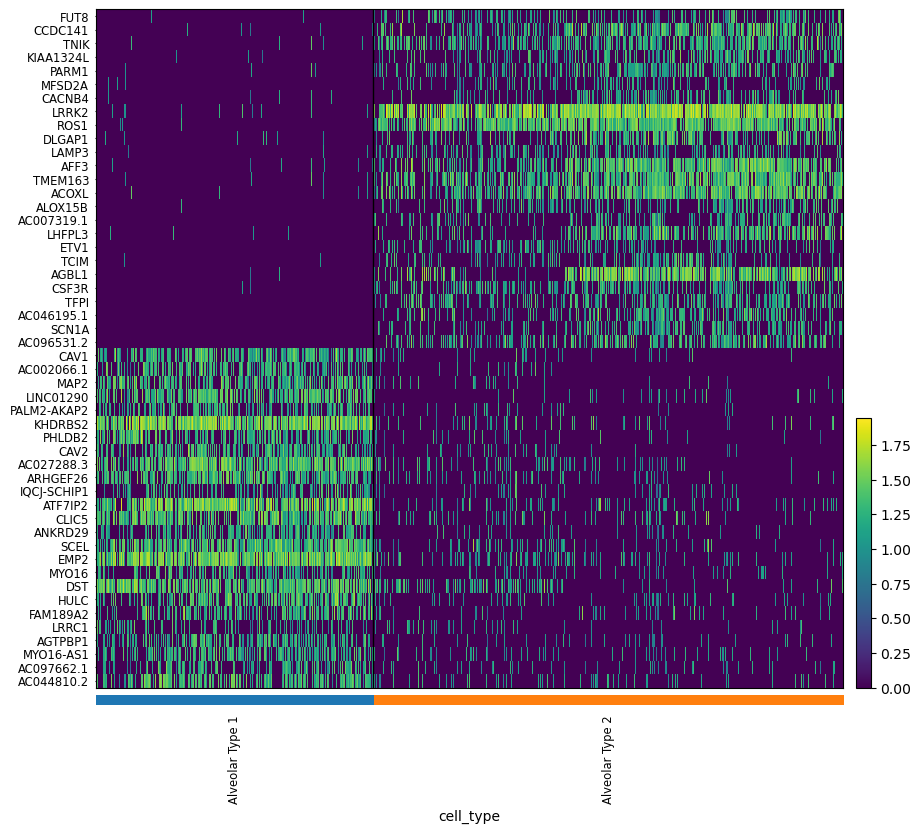

In [21]:
sc.pl.heatmap(subset, genes_to_show, groupby='cell_type', swap_axes=True)

### DE with SCVI

In [19]:
adata = sc.read_h5ad('labelled.h5ad')

In [23]:
adata.obs = adata.obs.rename(columns = {'cell type':'cell_type'})

In [20]:
model = scvi.model.SCVI.load('model.model', adata)

INFO     File model.model/model.pt already downloaded                                                              


In [21]:
model

SCVI Model with the following params: 
n_hidden: 128, n_latent: 10, n_layers: 1, dropout_rate: 0.1, dispersion: gene, gene_likelihood: zinb, 
latent_distribution: normal
Training status: Trained

In [24]:
scvi_de = model.differential_expression(
    idx1 = [adata.obs['cell_type'] == 'Alveolar Type 1'], # -> this is the same as filtering adata to subset above and just returns True or False if a cell is of that type
    idx2 = [adata.obs['cell_type'] == 'Alveolar Type 2']
    )


#compare conditions:
# scvi_de = model.differential_expression(
#     idx1 = [(adata.obs['cell_type'].isin(['Alveolar Type 1', 'Alveolar Type 2'])) & (adata.obs.condition == 'COVID19')], # -> this is the same as filtering adata to subset above and just returns True or False if a cell is of that type
#     idx2 = [(adata.obs['cell_type'].isin(['Alveolar Type 1', 'Alveolar Type 2'])) & (adata.obs.condition == 'control')]
#     )

DE...: 100%|██████████████████████████████████████| 1/1 [00:03<00:00,  3.95s/it]


In [26]:
scvi_de

,proba_de,proba_not_de,bayes_factor,scale1,scale2,pseudocounts,delta,lfc_mean,lfc_median,lfc_std,lfc_min,lfc_max,raw_mean1,raw_mean2,non_zeros_proportion1,non_zeros_proportion2,raw_normalized_mean1,raw_normalized_mean2,is_de_fdr_0.05
C10orf67,0.9992,0.0008,7.130086,0.000273,0.000001,0.0,0.25,8.789221,9.104849,2.645127,-3.025167,15.745831,0.250003,0.000517,0.165562,0.000517,2.315650,0.003923,True
SH3GL3,0.9990,0.0010,6.906745,0.000177,0.000002,0.0,0.25,7.325500,7.673064,2.134140,-3.067720,12.629744,0.178997,0.001240,0.136776,0.001136,1.741036,0.011421,True
DMBT1,0.9988,0.0012,6.724225,0.000006,0.000759,0.0,0.25,-7.379083,-7.520612,2.531186,-15.419264,3.254366,0.001221,0.696450,0.001221,0.226676,0.008382,6.391498,True
ROS1,0.9988,0.0012,6.724225,0.000044,0.002961,0.0,0.25,-8.381731,-8.861032,2.707952,-15.193011,3.331793,0.062805,3.225390,0.032449,0.814960,0.463821,30.276857,True
AUTS2,0.9984,0.0016,6.436144,0.000076,0.002462,0.0,0.25,-5.301266,-5.479166,1.750592,-11.010706,2.380069,0.084962,2.763853,0.061759,0.770637,0.721199,28.997036,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TM9SF3,0.5074,0.4926,0.029602,0.000139,0.000155,0.0,0.25,-0.156824,-0.149346,0.373991,-1.558191,1.390723,0.158062,0.187517,0.137299,0.159521,1.506439,1.779392,False
TAF2,0.4912,0.5088,-0.035204,0.000132,0.000133,0.0,0.25,-0.002509,-0.016595,0.369737,-1.385131,1.572124,0.122297,0.120571,0.110433,0.107346,1.219940,1.171367,False
ROCK1,0.4840,0.5160,-0.064022,0.000308,0.000290,0.0,0.25,0.098023,0.103171,0.354105,-1.457004,1.440429,0.360438,0.326064,0.281054,0.256948,3.583301,3.187920,False
ASCC2,0.4812,0.5188,-0.075235,0.000077,0.000078,0.0,0.25,-0.011602,-0.018348,0.366142,-1.563902,1.389301,0.066992,0.068499,0.062282,0.063746,0.667629,0.660094,False


In [27]:
#filter as above

scvi_de = scvi_de[(scvi_de['is_de_fdr_0.05']) & (abs(scvi_de.lfc_mean) > .5)]
scvi_de = scvi_de.sort_values('lfc_mean')
scvi_de

,proba_de,proba_not_de,bayes_factor,scale1,scale2,pseudocounts,delta,lfc_mean,lfc_median,lfc_std,lfc_min,lfc_max,raw_mean1,raw_mean2,non_zeros_proportion1,non_zeros_proportion2,raw_normalized_mean1,raw_normalized_mean2,is_de_fdr_0.05
HHIP,0.9978,0.0022,6.117091,1.603995e-06,4.224153e-04,0.0,0.25,-8.524351,-8.667325,3.115348,-17.437271,7.061539,0.000349,0.357061,0.000349,0.174192,0.002275,3.666476,True
LAMP3,0.9972,0.0028,5.875328,8.722126e-06,6.333764e-04,0.0,0.25,-8.519862,-8.989409,3.040722,-17.252064,6.382661,0.015003,0.589723,0.012561,0.354582,0.113792,5.664833,True
ROS1,0.9988,0.0012,6.724225,4.360729e-05,2.960835e-03,0.0,0.25,-8.381731,-8.861032,2.707952,-15.193011,3.331793,0.062805,3.225390,0.032449,0.814960,0.463821,30.276857,True
AC096531.2,0.9972,0.0028,5.875328,6.117284e-06,9.160088e-04,0.0,0.25,-7.875340,-8.320282,2.605353,-15.037647,5.488337,0.002094,1.056403,0.002094,0.429900,0.010598,10.518647,True
CHI3L1,0.9964,0.0036,5.623212,4.832010e-07,2.585618e-05,0.0,0.25,-7.687917,-7.928529,3.068289,-17.168133,4.704556,0.000349,0.054448,0.000349,0.039983,0.003108,0.476897,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SH3GL3,0.9990,0.0010,6.906745,1.768445e-04,2.372635e-06,0.0,0.25,7.325500,7.673064,2.134140,-3.067720,12.629744,0.178997,0.001240,0.136776,0.001136,1.741036,0.011421,True
LINC00842,0.9930,0.0070,4.954819,7.570636e-05,4.700922e-06,0.0,0.25,7.467819,8.083570,3.125085,-4.972098,14.733777,0.080077,0.005269,0.073447,0.004753,0.773519,0.040129,True
SEMA3E,0.9968,0.0032,5.741396,1.632380e-04,7.524121e-07,0.0,0.25,7.659376,7.926535,3.110674,-3.971695,15.933078,0.191034,0.000310,0.117411,0.000103,1.714244,0.005065,True
CACNG4,0.9950,0.0050,5.293303,1.473240e-04,4.603565e-06,0.0,0.25,7.768523,8.306519,2.845022,-2.514884,15.395785,0.129624,0.005269,0.107641,0.004443,1.367753,0.050731,True


In [28]:
#filter those low in both groups
scvi_de = scvi_de[(scvi_de.raw_normalized_mean1 > .5) | (scvi_de.raw_normalized_mean2 > .5)]
scvi_de

,proba_de,proba_not_de,bayes_factor,scale1,scale2,pseudocounts,delta,lfc_mean,lfc_median,lfc_std,lfc_min,lfc_max,raw_mean1,raw_mean2,non_zeros_proportion1,non_zeros_proportion2,raw_normalized_mean1,raw_normalized_mean2,is_de_fdr_0.05
HHIP,0.9978,0.0022,6.117091,0.000002,4.224153e-04,0.0,0.25,-8.524351,-8.667325,3.115348,-17.437271,7.061539,0.000349,0.357061,0.000349,0.174192,0.002275,3.666476,True
LAMP3,0.9972,0.0028,5.875328,0.000009,6.333764e-04,0.0,0.25,-8.519862,-8.989409,3.040722,-17.252064,6.382661,0.015003,0.589723,0.012561,0.354582,0.113792,5.664833,True
ROS1,0.9988,0.0012,6.724225,0.000044,2.960835e-03,0.0,0.25,-8.381731,-8.861032,2.707952,-15.193011,3.331793,0.062805,3.225390,0.032449,0.814960,0.463821,30.276857,True
AC096531.2,0.9972,0.0028,5.875328,0.000006,9.160088e-04,0.0,0.25,-7.875340,-8.320282,2.605353,-15.037647,5.488337,0.002094,1.056403,0.002094,0.429900,0.010598,10.518647,True
SLC26A9,0.9982,0.0018,6.318161,0.000003,1.989011e-04,0.0,0.25,-7.646064,-8.077011,2.555121,-14.775642,4.862301,0.002094,0.232666,0.002094,0.175948,0.020623,2.241992,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SH3GL3,0.9990,0.0010,6.906745,0.000177,2.372635e-06,0.0,0.25,7.325500,7.673064,2.134140,-3.067720,12.629744,0.178997,0.001240,0.136776,0.001136,1.741036,0.011421,True
LINC00842,0.9930,0.0070,4.954819,0.000076,4.700922e-06,0.0,0.25,7.467819,8.083570,3.125085,-4.972098,14.733777,0.080077,0.005269,0.073447,0.004753,0.773519,0.040129,True
SEMA3E,0.9968,0.0032,5.741396,0.000163,7.524121e-07,0.0,0.25,7.659376,7.926535,3.110674,-3.971695,15.933078,0.191034,0.000310,0.117411,0.000103,1.714244,0.005065,True
CACNG4,0.9950,0.0050,5.293303,0.000147,4.603565e-06,0.0,0.25,7.768523,8.306519,2.845022,-2.514884,15.395785,0.129624,0.005269,0.107641,0.004443,1.367753,0.050731,True


In [29]:
genes_to_show = scvi_de[-25:].index.tolist() + scvi_de[:25].index.tolist()
genes_to_show

['AL359378.1',
 'AC022325.2',
 'HS3ST5',
 'KCNIP1',
 'CNTN6',
 'EYA4',
 'KCNT2',
 'SLC6A4',
 'NCKAP5',
 'ANKRD1',
 'AC245041.2',
 'ROR1-AS1',
 'NCKAP5-AS2',
 'SCUBE1',
 'AP002856.2',
 'AC095050.1',
 'CTNND2',
 'TARID',
 'AL355499.1',
 'RTKN2',
 'SH3GL3',
 'LINC00842',
 'SEMA3E',
 'CACNG4',
 'C10orf67',
 'HHIP',
 'LAMP3',
 'ROS1',
 'AC096531.2',
 'SLC26A9',
 'SCN1A',
 'DMBT1',
 'ACOXL',
 'SFTPA2',
 'LRRC4C',
 'PCSK2',
 'SFTPA1',
 'CXCL17',
 'LRRK2',
 'RGS7',
 'CCDC141',
 'STEAP4',
 'PARM1',
 'TCIM',
 'CTSH',
 'FGG',
 'RASGRF1',
 'AC046195.1',
 'PLA2G4F',
 'CNR1']

In [ ]:
#need 'subset' as adata before being filtered down to 5k genes
subset = sc.read_h5ad('subset.h5ad')

/home/jared/mambaforge/envs/scvi-env/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


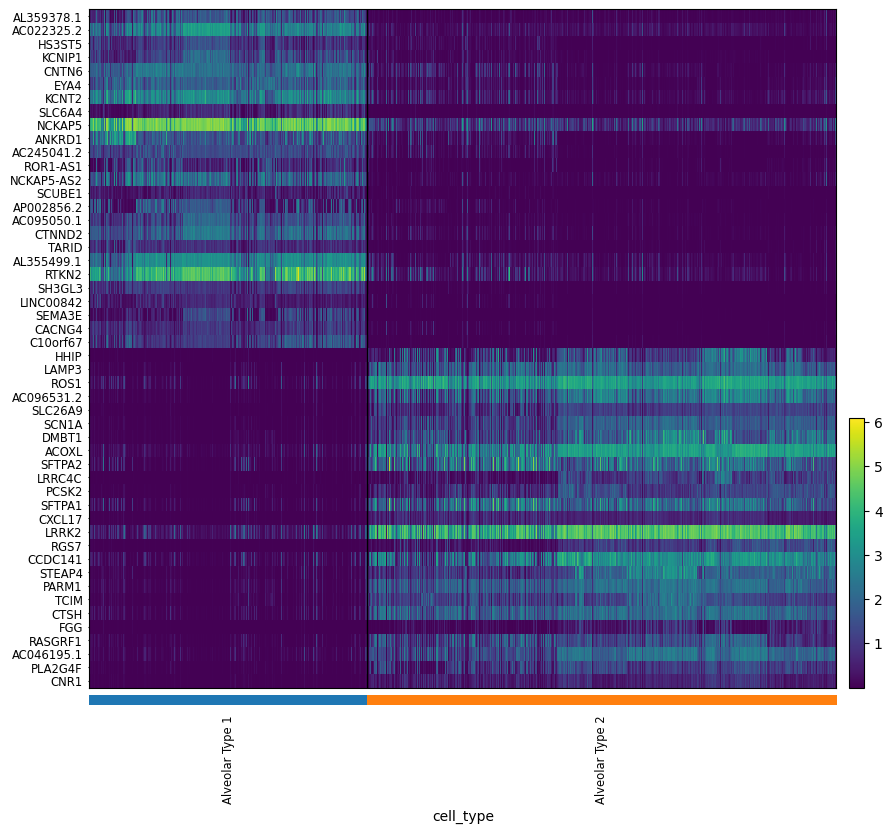

In [40]:
sc.pl.heatmap(subset, genes_to_show, groupby='cell_type', swap_axes=True, layer='scvi_normalized', log=True)

## Gene ontology enrichment

In [22]:
subset = sc.read_h5ad('subset.h5ad')

In [24]:
gp.get_library_name()
#GO_Biological_Process_2021
#KEGG_2021_Human

['ARCHS4_Cell-lines',
 'ARCHS4_IDG_Coexp',
 'ARCHS4_Kinases_Coexp',
 'ARCHS4_TFs_Coexp',
 'ARCHS4_Tissues',
 'Achilles_fitness_decrease',
 'Achilles_fitness_increase',
 'Aging_Perturbations_from_GEO_down',
 'Aging_Perturbations_from_GEO_up',
 'Allen_Brain_Atlas_10x_scRNA_2021',
 'Allen_Brain_Atlas_down',
 'Allen_Brain_Atlas_up',
 'Azimuth_Cell_Types_2021',
 'BioCarta_2013',
 'BioCarta_2015',
 'BioCarta_2016',
 'BioPlanet_2019',
 'BioPlex_2017',
 'CCLE_Proteomics_2020',
 'CORUM',
 'COVID-19_Related_Gene_Sets',
 'COVID-19_Related_Gene_Sets_2021',
 'Cancer_Cell_Line_Encyclopedia',
 'CellMarker_Augmented_2021',
 'ChEA_2013',
 'ChEA_2015',
 'ChEA_2016',
 'ChEA_2022',
 'Chromosome_Location',
 'Chromosome_Location_hg19',
 'ClinVar_2019',
 'DSigDB',
 'Data_Acquisition_Method_Most_Popular_Genes',
 'DepMap_WG_CRISPR_Screens_Broad_CellLines_2019',
 'DepMap_WG_CRISPR_Screens_Sanger_CellLines_2019',
 'Descartes_Cell_Types_and_Tissue_2021',
 'Diabetes_Perturbations_GEO_2022',
 'DisGeNET',
 'Disease_

In [6]:
subset

AnnData object with n_obs × n_vars = 15411 × 10000
    obs: 'Sample', 'doublet', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', '_scvi_batch', '_scvi_labels', 'leiden', '_scvi_raw_norm_scaling', 'cell_type', 'condition'
    var: 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'Sample_colors', '_scvi_manager_uuid', '_scvi_uuid', 'cell type_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'markers', 'neighbors', 'rank_genes_groups', 'scvi_markers', 'umap'
    obsm: 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs', '_scvi_extra_continuous_covs'
    layers: 'counts', 'scvi_normalized'
    obsp: 'connectivities', 'distances'

In [25]:
#looking at upregulated genes
dedf[dedf.log2fc > 0].gene.tolist()

['CAV1',
 'AC002066.1',
 'MAP2',
 'LINC01290',
 'PALM2-AKAP2',
 'KHDRBS2',
 'PHLDB2',
 'CAV2',
 'AC027288.3',
 'ARHGEF26',
 'IQCJ-SCHIP1',
 'ATF7IP2',
 'CLIC5',
 'ANKRD29',
 'SCEL',
 'EMP2',
 'MYO16',
 'DST',
 'HULC',
 'FAM189A2',
 'LRRC1',
 'AGTPBP1',
 'MYO16-AS1',
 'AC097662.1',
 'AC044810.2',
 'VEGFA',
 'DENND3',
 'SLC19A1',
 'PAPSS2',
 'PALLD',
 'ABCA1',
 'EPB41L4A',
 'LAMA3',
 'CYP4B1',
 'COL4A3',
 'COL4A4',
 'ANO6',
 'ROR1',
 'ARHGAP42',
 'CLDN18',
 'AC112206.2',
 'MYH9',
 'TMOD3',
 'RBMS3',
 'PTPN14',
 'GALNT18',
 'RAB11FIP1',
 'DOCK4',
 'GPRC5D-AS1',
 'PEAK1',
 'AC018362.1',
 'UBL3',
 'TNS3',
 'DMD',
 'SAMD4A',
 'APBB2',
 'NXN',
 'ANXA2',
 'SLC1A1',
 'PPM1L',
 'RAB31',
 'FAM107B',
 'PACS1',
 'SPTBN1',
 'EPB41L5',
 'KRT7',
 'DAPK2',
 'QKI',
 'BMPR1A',
 'FLNB',
 'TNS1',
 'CD55',
 'RASAL2',
 'ARAP2',
 'GOLGA8B',
 'AC011444.2',
 'KRT19',
 'TJP1',
 'KLF6',
 'WWC2',
 'GPRC5A',
 'ABLIM1',
 'RASSF8',
 'RDX',
 'FARP1',
 'ARRB1',
 'JAZF1',
 'AC098617.1',
 'COBL',
 'SCAI',
 'HIP1',
 'DGKH

In [26]:
enr = gp.enrichr(gene_list = dedf[dedf.log2fc > 0].gene.tolist(),
                gene_sets=['KEGG_2021_Human', 'GO_Biological_Process_2021'],
                 organism='human',
                 outdir=None,
                 background = subset.var_names.tolist()
                )

In [27]:
enr.results

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,KEGG_2021_Human,Focal adhesion,7/201,0.000173,0.015530,0,0,6.518018,56.477347,CAV2;CAV1;COL4A4;COL4A3;LAMA3;FLNB;VEGFA
1,KEGG_2021_Human,Protein digestion and absorption,4/103,0.003055,0.079434,0,0,7.137446,41.332126,COL4A4;COL4A3;SLC1A1;COL8A1
2,KEGG_2021_Human,Tight junction,5/169,0.003063,0.079434,0,0,5.416392,31.352196,TJP1;AFDN;RDX;MYH9;CLDN18
3,KEGG_2021_Human,Endocytosis,6/252,0.003530,0.079434,0,0,4.354324,24.585992,RAB31;RAB11FIP1;CAV2;CAV1;ARAP2;ARRB1
4,KEGG_2021_Human,Viral myocarditis,3/60,0.005116,0.087808,0,0,9.234746,48.717278,CAV1;DMD;CD55
...,...,...,...,...,...,...,...,...,...,...
1235,GO_Biological_Process_2021,cytokine-mediated signaling pathway (GO:0019221),2/621,0.879210,0.882279,0,0,0.546014,0.070289,ANXA2;VEGFA
1236,GO_Biological_Process_2021,cellular protein metabolic process (GO:0044267),1/417,0.913817,0.916207,0,0,0.406940,0.036675,DENND3
1237,GO_Biological_Process_2021,negative regulation of nucleic acid-templated ...,1/464,0.934835,0.936464,0,0,0.364748,0.024579,NCOR2
1238,GO_Biological_Process_2021,positive regulation of nucleic acid-templated ...,1/511,0.950761,0.951588,0,0,0.330332,0.016679,KLF6


In [ ]:
#TODO: plot above

## Comparisons

/home/jared/mambaforge/envs/scvi-env/lib/python3.10/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


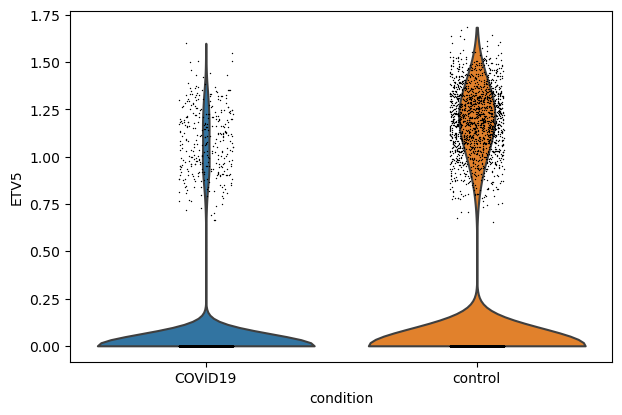

In [29]:
sc.pl.violin(subset[subset.obs.cell_type == 'Alveolar Type 2'], 'ETV5', groupby='condition')

In [30]:
from scipy import stats

In [35]:
subset.X

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [37]:
temp = subset[subset.obs.cell_type == 'Alveolar Type 2']

i = np.where(temp.var_names == 'ETV5')[0][0]

In [38]:
a = temp[temp.obs.condition == 'COVID19'].X[:,i]
b = temp[temp.obs.condition == 'control'].X[:,i]

In [39]:
b

ArrayView([0.        , 0.9833945 , 0.65544504, ..., 0.        ,
           0.        , 0.        ], dtype=float32)

In [ ]:
#not normally distributed - no T-test. Non-parametric instead!

In [40]:
stats.mannwhitneyu(a,b)

MannwhitneyuResult(statistic=8970562.0, pvalue=4.171303252934207e-93)

### DATP signature

In [41]:
with open('datp_signature.txt') as f:
    datp_sig = [x.strip() for x in list(f)]

In [42]:
datp_sig

['FTL',
 'KRT8',
 'ACTB',
 'S100A6',
 'B2M',
 'TMSB4X',
 'CDKN1A',
 'CLDN4',
 'HLA-B',
 'HLA-A',
 'RPL36',
 'ACTG1',
 'RPL7A',
 'RPS19',
 'RPL8',
 'EEF1A1',
 'SFN',
 'RPL41',
 'RPLP1',
 'RPL13A',
 'RPS28',
 'RPL13',
 'RPS27A',
 'RPL37A',
 'RPS2',
 'RPL28',
 'RPLP0',
 'RPL3',
 'PTMA',
 'RPL10',
 'EEF2',
 'HSP90AB1',
 'MYL6',
 'CD63',
 'TMBIM6',
 'CCND1',
 'RPL21',
 'KRT18',
 'P4HB',
 'RPS3',
 'JUND',
 'CEACAM6',
 'HSP90AA1',
 'TPT1',
 'KRT19',
 'CD151',
 'H3F3B',
 'SOX4',
 'KRT7',
 'SDC1',
 'NORAD',
 'CANX',
 'FLNA',
 'PKM',
 'RPS24',
 'MT-ND4',
 'ZFP36L1',
 'MT-CO2',
 'MTRNR2L12',
 'UBC',
 'TRAM1',
 'MT-ND2',
 'MT-CO3',
 'MT-ND1',
 'S100A10',
 'MT-CO1',
 'SQSTM1',
 'MT-ATP6',
 'LAMB3',
 'TAPBP',
 'RPS9',
 'TM4SF1',
 'MT-ND4L',
 'STOM',
 'TMEM30A',
 'CD59',
 'PLXNB2',
 'MT-ND5',
 'PABPC1',
 'MT-CYB',
 'NPC2',
 'TPM4',
 'ANXA2',
 'MT-ND3',
 'ITGA2',
 'TKT',
 'ITGB1',
 'TNFRSF1A',
 'APLP2',
 'DHCR24',
 'MYH9',
 'ICAM1',
 'MUC1',
 'MSN',
 'GSN',
 'CDC42',
 'RAC1',
 'YWHAZ',
 'CALM2',
 'MT-

In [43]:
sc.tl.score_genes(subset, datp_sig, score_name = 'datp')

/home/jared/mambaforge/envs/scvi-env/lib/python3.10/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


In [44]:
subset.obs
#datp is value of expression of list of genes compared to background!

,Sample,doublet,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo,_scvi_batch,_scvi_labels,leiden,_scvi_raw_norm_scaling,cell_type,condition,datp
CTGGTCTTCCATGCAA-1_2,C52ctr,False,2271,2339,7657.0,0.0,0.000000,2.0,0.026120,0,0,2,1.971220,Alveolar Type 2,control,0.063218
AGGATAAAGCCGCACT-1_2,C52ctr,False,2455,2536,7023.0,206.0,2.933219,18.0,0.256301,0,0,2,2.024292,Alveolar Type 2,control,0.294028
TACCTGCAGCATCCCG-1_2,C52ctr,False,2367,2433,6663.0,0.0,0.000000,6.0,0.090050,0,0,2,2.222222,Alveolar Type 2,control,-0.009027
TATATCCAGCTCCCTT-1_2,C52ctr,False,2394,2460,6562.0,1.0,0.015239,5.0,0.076196,0,0,2,2.298851,Alveolar Type 2,control,-0.000548
AACCACACACATTACG-1_2,C52ctr,False,2204,2283,6245.0,0.0,0.000000,3.0,0.048038,0,0,2,2.275313,Alveolar Type 2,control,-0.043652
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AGGGCCTAGATGAACT-1_24,L18cov,False,417,422,528.0,11.0,2.083333,0.0,0.000000,0,0,7,27.624310,Alveolar Type 2,COVID19,0.088969
GTACAACCATGACGAG-1_24,L18cov,False,403,406,505.0,5.0,0.990099,0.0,0.000000,0,0,7,30.487804,Alveolar Type 2,COVID19,0.013367
TAGATCGCAGCCTTCT-1_24,L18cov,False,402,405,501.0,1.0,0.199601,1.0,0.199601,0,0,7,33.898304,Alveolar Type 2,COVID19,0.070002
GCACATAAGATGAACT-1_24,L18cov,False,425,431,499.0,1.0,0.200401,0.0,0.000000,0,0,7,31.545742,Alveolar Type 2,COVID19,0.040522


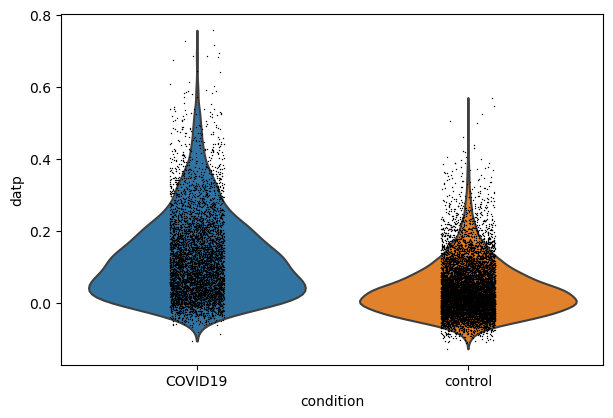

In [46]:
sc.pl.violin(subset, 'datp', groupby='condition')

In [47]:
a = subset[subset.obs.condition == 'COVID19'].obs.datp.values
b = subset[subset.obs.condition == 'control'].obs.datp.values

stats.mannwhitneyu(a,b)

MannwhitneyuResult(statistic=40658258.0, pvalue=0.0)

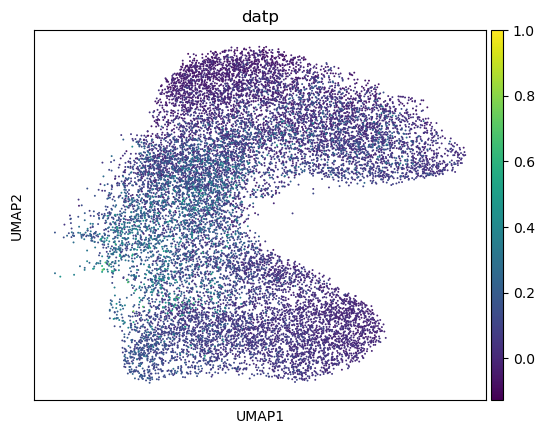

In [50]:
sc.pl.umap(subset, color = 'datp', vmax = 1)